### Preprocessing of predictions and determination of interface mutations

In [1]:
import pandas as pd
import matplotlib
import warnings
import os
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
import analysis_utils
from copy import deepcopy

# path to repository folder (data is stored here as well)
path = '..'
preds_loc = os.path.join(path, 'data', 'analysis', 'q3421_analysis.csv')

# default plotting settings
font = {'size'   : 18}
matplotlib.rc('font', **font)

# notebook display options
warnings.filterwarnings('ignore')
pd.options.display.max_rows = 300

# load dictionaries to improve formatting of model names
remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

# load the predictions and split them into dataframes
db = pd.read_csv(preds_loc).set_index(['uid', 'uid2'])

Original unique mutations: 3421
['mif_dir', 'mifst_dir', 'mpnn_10_00_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir', 'esm2_3B_dir', 'esmif_multimer_dir', 'esm2_15B_half_dir', 'esmif_monomer_dir', 'tranception_weights_dir', 'msa_1_dir', 'msa_2_dir', 'msa_3_dir', 'msa_4_dir', 'msa_5_dir', 'msa_transformer_median_dir', 'msa_transformer_mean_dir', 'tranception_dir', 'esm2_150M_dir', 'esm2_650M_dir', 'ankh_dir', 'esm1v_1_dir', 'esm1v_2_dir', 'esm1v_3_dir', 'esm1v_4_dir', 'esm1v_5_dir', 'esm1v_median_dir', 'esm1v_mean_dir', 'korpm_dir', 'cartesian_ddg_dir']
['mif_dir', 'mifst_dir', 'mpnn_10_00_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir', 'esm2_3B_dir', 'esmif_multimer_dir', 'esm2_15B_half_dir', 'esmif_monomer_dir', 'tranception_weights_dir', 'msa_transformer_median_dir', 'msa_transformer_mean_dir', 'tranception_dir', 'esm2_150M_dir', 'esm2_650M_dir', 'ankh_dir', 'esm1v_median_dir', 'esm1v_mean_dir', 'korpm_dir', 'cartesian_ddg_dir']
Detected 179 interface mutations


,,mif_dir,mifst_dir,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,esm2_3B_dir,esmif_multimer_dir,esm2_15B_half_dir,esmif_monomer_dir,tranception_weights_dir,...,esm1v_5_dir,esm1v_median_dir,esm1v_mean_dir,korpm_dir,cartesian_ddg_dir,ddG,cluster,mpnn_rosetta_dir,random_dir,ddG_dir
uid,uid2,,,,,,,,,,,,,,,,,,,,,
1A23_30S,1A23_30S,1.864485,-6.805952,1.810260,2.009976,-1.147786,-11.571676,-0.043713,-11.668701,-0.043712,-0.108554,...,-13.370916,-13.370916,-13.061886,-0.241,-1.567467,-1.80,43,0.442510,-1.325125,-1.80
1A23_32L,1A23_32L,1.119251,-7.800102,0.095243,2.145201,-0.386124,-13.755667,-0.042389,-13.076172,-0.042389,-0.059629,...,-11.998137,-11.998137,-12.214681,0.365,1.773667,4.95,43,3.918868,1.073808,4.95
1A23_32S,1A23_32S,-0.854073,-5.414868,0.301296,0.877654,0.752050,-8.291791,-0.029983,-10.436035,-0.029983,-0.032270,...,-8.345301,-6.640480,-6.917703,-0.181,-2.198333,4.40,43,-1.320679,0.658966,4.40
1A23_32Y,1A23_32Y,1.528646,-3.414633,-0.108550,0.747990,0.164768,-8.121881,-0.020219,-9.415039,-0.020219,-0.039056,...,NaN,NaN,NaN,1.152,0.767000,4.63,43,1.514990,-0.562769,4.63
1A23_33S,1A23_33S,0.348253,-5.093968,1.341104,-0.472430,0.157554,-12.002896,-0.024960,-12.722168,-0.024960,-0.076600,...,-12.898417,-7.950251,-9.768216,-0.848,0.794333,-1.10,43,0.321903,0.324243,-1.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5CRO_26L,5CRO_26L,-0.438132,-0.126320,0.130304,0.337329,0.194948,-3.150103,-0.038055,-2.374512,-0.037373,-0.095336,...,NaN,NaN,NaN,-0.780,2.229000,1.10,31,2.566329,0.461661,1.10
5CRO_26Q,5CRO_26Q,0.140129,0.700469,1.668023,1.180899,1.713544,-2.508844,-0.006247,-2.625244,-0.004605,-0.045372,...,NaN,NaN,NaN,-0.140,1.705000,1.40,31,2.885899,0.281723,1.40
5CRO_26V,5CRO_26V,0.501243,1.538724,1.425710,0.879769,0.474643,-3.204980,0.032355,-2.228027,0.037691,-0.047876,...,NaN,NaN,NaN,-0.459,1.136000,0.90,31,2.015769,-1.283386,0.90


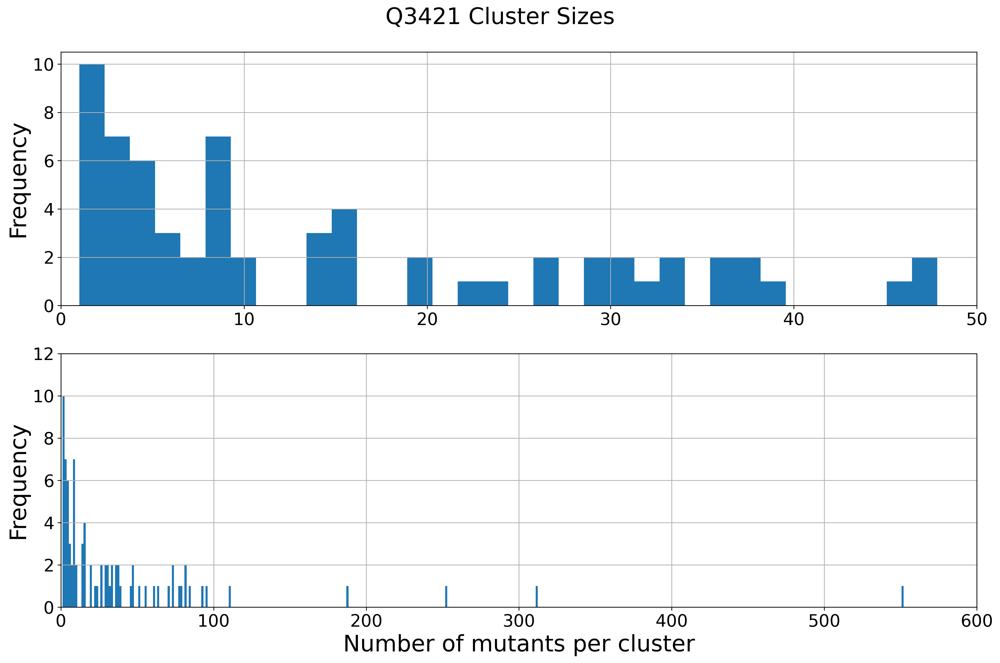

In [2]:
db_class = db

print('Original unique mutations:', len(db_class))

evolutionary = ['tranception', 'msa_transformer', 'esm1v', 'msa', 'esm2', 'ankh']
structural = ['mpnn', 'mif', 'mifst', 'esmif', 'mutcomputex']
supervised = ['MAESTRO', 'ThermoNet', 'INPS', 'PremPS', 'mCSM', 'DUET', 'ACDC', 'I-Mutant3.0', 'SAAFEC', 'MuPro']
untrained = ['DDGun']
potential = ['KORPM', 'PopMusic', 'SDM', 'korpm']
biophysical = ['cartesian_ddg', 'FoldX', 'Evo', 'Cartddg']
transfer = ['stability-oracle']

original_pred_cols = db_class.columns[db_class.columns.str.contains('|'.join(evolutionary + structural + supervised + untrained + potential + biophysical + transfer))]
original_pred_cols = list(original_pred_cols.drop(['reduced_msa_file', 'full_msa_file', 'tranception_dms', 'msa_weights']))#, 'msa_weights']))
original_pred_cols = [c for c in original_pred_cols if not 'runtime' in c]
original_pred_cols = [c for c in original_pred_cols if not 'cluster' in c]
original_pred_cols = [c for c in original_pred_cols if not 'overlaps' in c]
original_pred_cols = [c for c in original_pred_cols if not 'pll' in c]
print(original_pred_cols)

db_runtimes = db[[c for c in db.columns if 'runtime' in c]]

original_pred_cols_reduced = deepcopy(original_pred_cols)
for col in [f'esm1v_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)
for col in [f'msa_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)

print(original_pred_cols_reduced)

db_class = db_class[original_pred_cols + ['ddG', 'cluster']]

#db_class_rescaled = db_class.copy(deep=True)
#db_class_rescaled[original_pred_cols] /= db_class_rescaled[original_pred_cols].std()

db_class['mpnn_rosetta_dir'] = db_class['cartesian_ddg_dir'] + db_class['mpnn_20_00_dir']
db_class['random_dir'] = np.random.normal(loc=0, size=len(db_class))
#db_class['korpm_dir'] = db_class['KORPMD_dir']
db_class['ddG_dir'] = db_class['ddG']

#db_class = db_class.drop([c+'_dir' for c in ['ACDCNND', 'FoldXD', 'DDGunD', 'CartddgD']], axis=1) #'PopMsD', 'TNetD'

print(f'Detected {len(db_class.loc[db["on_interface_dir"].astype(bool)])} interface mutations')

fig, axes = plt.subplots(2, figsize=(15, 10), dpi=300) 

db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[0])
axes[0].set_xlim([0, 50]) 
axes[0].tick_params(axis='x', labelsize=18) 
axes[0].set_ylabel('Frequency', fontsize=24)  

# Second plot
db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[1])
axes[1].set_xlim([0, 600]) 
axes[1].set_ylim([0, 12])  
axes[1].set_xlabel('Number of mutants per cluster', fontsize=24) 
axes[1].set_ylabel('Frequency', fontsize=24)
axes[1].tick_params(axis='x', labelsize=18)

plt.suptitle('Q3421 Cluster Sizes', fontsize=24)
plt.tight_layout()

db_class

db_class

In [3]:
# Clusters with >= or < 50 unique mutants
print((db_class.groupby('cluster').count().iloc[:, 0] >= 50).sum(), (db_class.groupby('cluster').count().iloc[:, 0] < 50).sum())

19 65


### Recursive Feature Addition (Figure 3C)

1758


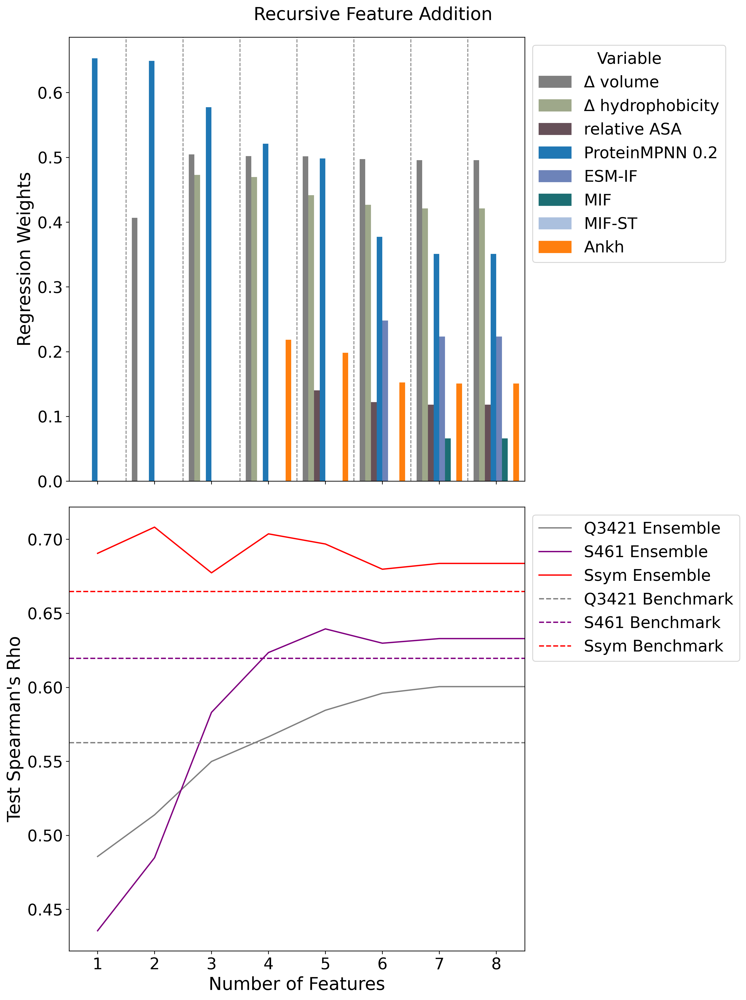

In [4]:
from sklearn.linear_model import Ridge, LinearRegression
from sklearn.kernel_ridge import KernelRidge
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler, MinMaxScaler, PolynomialFeatures
import importlib
importlib.reload(analysis_utils)

cols2 = ['delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'esmif_multimer_dir', 'mpnn_20_00_dir', 'mif_dir', 'mifst_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'ankh_dir', 'tranception_dir'] #'mutcomputex_dir',
df_train = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0)
df_train = df_train.loc[~df_train['overlaps_seq_ssym']].loc[~df_train['overlaps_seq_s461']]
print(len(df_train))
df_test = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0).drop(['ProTherm', 'ddG'], axis=1).fillna(0)
df_test_s461 = pd.read_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv')).set_index('uid')
df_test_s461 = df_test_s461[[c for c in df_test_s461.columns if not 'q3421_pslm' in c]]
df_test_s461.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_s461.columns]
df_test_ssym = pd.read_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv')).set_index('uid')
df_test_ssym = df_test_ssym[[c for c in df_test_ssym.columns if not 'q3421_pslm' in c]]
#df_test_ssym.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA', 'ddG'] else c for c in df_test_ssym.columns]
df_test_ssym.columns = [c+'_dir' for c in df_test_ssym.columns]

dfs_test = {'q3421': df_test, 's461': df_test_s461, 'ssym': df_test_ssym}

test_scores, weights_df, dfs_test = analysis_utils.custom_recursive_feature_addition(df_train, dfs_test, cols2, 'ddG_dir', LinearRegression(positive=True), fillna=True, source='q3421_pslm')

df_test_q3421 = dfs_test['q3421']
df_test_q3421 = df_test_q3421.rename(dict(zip([c for c in df_test_q3421.columns if 'rfa_' in c], [c+'_dir' for c in df_test_q3421.columns if 'rfa_' in c])), axis=1)
db_class = db_class[[c for c in db_class.columns if not 'q3421_pslm' in c]]
db_class = db_class.join(df_test_q3421[[c for c in df_test_q3421.columns if 'rfa_' in c]])

df_test_s461 = dfs_test['s461']
df_test_s461 = df_test_s461.rename(dict(zip([c for c in df_test_s461.columns if 'rfa_' in c], [c+'_dir' for c in df_test_s461.columns if 'rfa_' in c])), axis=1)
df_test_s461.to_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv'))

df_test_ssym = dfs_test['ssym']
df_test_ssym = df_test_ssym.rename(dict(zip([c for c in df_test_ssym.columns if '_dir' in c], [c[:-4] for c in df_test_ssym.columns if '_dir' in c])), axis=1)
df_test_ssym.to_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv'))

### Recursive Feature Addition (All Models) (Supplementary Figure 9)

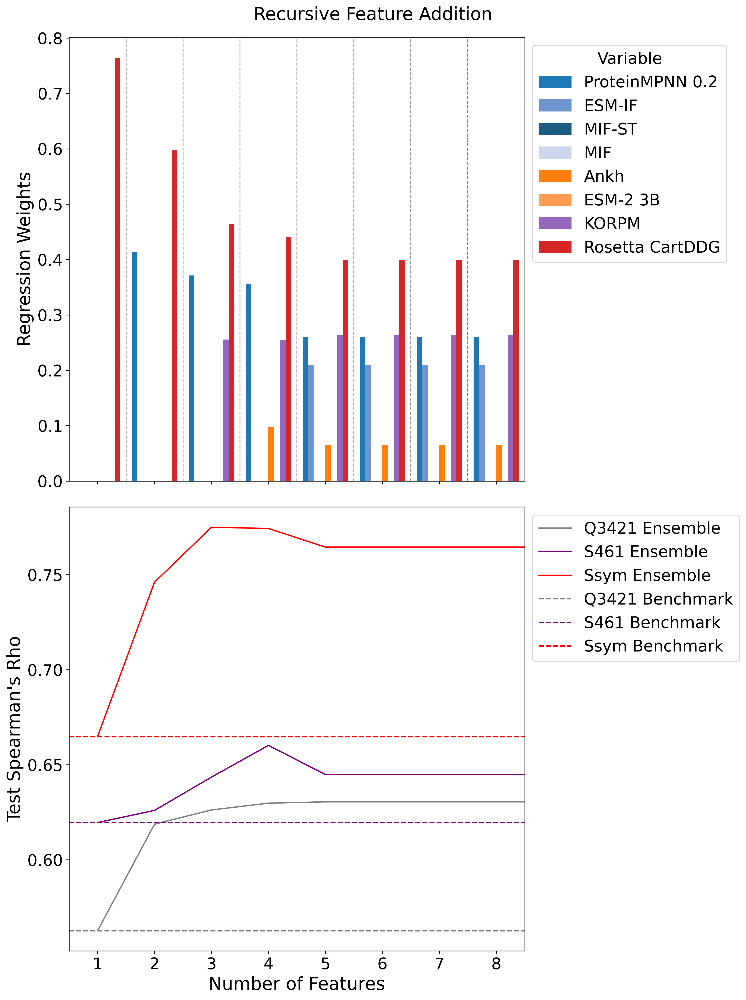

In [5]:
cols2 = ['cartesian_ddg_dir', 'korpm_dir', 'esmif_multimer_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir', 'esm2_3B_dir', 'mifst_dir', 'mif_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'ankh_dir', 'tranception_dir']#, 'mutcomputex_dir']
df_train = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0)
df_train = df_train.loc[~df_train['overlaps_seq_ssym']].loc[~df_train['overlaps_seq_s461']]
df_test = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0).drop(['ProTherm', 'ddG'], axis=1).fillna(0)
df_test_s461 = pd.read_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv')).set_index('uid')
df_test_s461 = df_test_s461[[c for c in df_test_s461.columns if not 'q3421_all' in c]]
df_test_s461.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_s461.columns]
df_test_ssym = pd.read_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv')).set_index('uid')
df_test_ssym = df_test_ssym[[c for c in df_test_ssym.columns if not 'q3421_all' in c]]
#df_test_ssym.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA', 'ddG'] else c for c in df_test_ssym.columns]
df_test_ssym.columns = [c+'_dir' for c in df_test_ssym.columns]

dfs_test = {'q3421': df_test, 's461': df_test_s461, 'ssym': df_test_ssym}

test_scores, weights_df, dfs_test = analysis_utils.custom_recursive_feature_addition(df_train, dfs_test, cols2, 'ddG_dir', LinearRegression(positive=True), fillna=True, source='q3421_all')

df_test_q3421 = dfs_test['q3421']
df_test_q3421 = df_test_q3421.rename(dict(zip([c for c in df_test_q3421.columns if 'rfa_' in c], [c+'_dir' for c in df_test_q3421.columns if 'rfa_' in c])), axis=1)
db_class = db_class[[c for c in db_class.columns if not 'q3421_all' in c]]
db_class = db_class.join(df_test_q3421[[c for c in df_test_q3421.columns if 'rfa_' in c]])

df_test_s461 = dfs_test['s461']
df_test_s461 = df_test_s461.rename(dict(zip([c for c in df_test_s461.columns if 'rfa_' in c], [c+'_dir' for c in df_test_s461.columns if 'rfa_' in c])), axis=1)
df_test_s461.to_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv'))

df_test_ssym = dfs_test['ssym']
df_test_ssym = df_test_ssym.rename(dict(zip([c for c in df_test_ssym.columns if '_dir' in c], [c[:-4] for c in df_test_ssym.columns if '_dir' in c])), axis=1)
df_test_ssym.to_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv'))

### Non-bootstrapped Analysis of Q3421 (not in text)

In [6]:
# TABLE 1
# Note: due to changes in the dependencies and small changes to preprocessing,
# results have changed very slightly from the current revision, but do not affect
# the interpretation of results or conclusions

# could replace stats=() with ('n', 'MCC', 'auprc', 'ndcg', 'spearman')
# but then you would not be saving the other stats. 
# uncomment to_csv lines to save to a custom location
#db_class['code'] = db_class.index.str[:4]
summ = analysis_utils.compute_stats(db_class[original_pred_cols_reduced + ['cluster', 'ddG', 'mpnn_rosetta_dir']], 
                                    stats=('n', 'MCC', 'pred_positives', 'tp', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'tp', 'recall@k1.0', 'aumsc', 'auppc'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=0)
rcv = summ.copy(deep=True)
summ.to_csv('../data/extended/q3421_extended.csv')
tmp1 = summ #.loc[:,['n', 'MCC', 'auprc', 'spearman', 'weighted_ndcg', 'weighted_auprc', 'weighted_spearman']]
tmp = tmp1.sort_values(['measurement', 'weighted_spearman'], ascending=False).reset_index()

tmp['model'] = tmp['model'].map(remap_names_2)
tmp['measurement'] = tmp['measurement'].map({'ddG': 'ΔΔG', 'dTm': 'ΔTm'})
tmp.loc[tmp['model'].isin(['Gaussian noise', 'ΔΔG', 'ΔTm']), 'model_type'] = 'N/A'

remap_cols = {'auprc': 'AUPRC', 'spearman': 'ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR'}
tmp = tmp.rename(remap_cols, axis=1)
tmp = tmp[['measurement', 'model_type', 'model', 'n', 'MCC', 'AUPRC', 'ρ', 'wNDCG', 'wAUPRC', 'wρ', 'mean_t1s', 'Net Stabilization', 'pred_positives', 
 'mean_stabilization', 'True Positives', 'Sensitivity', 'MRR', 'recall@k1.0']]#, 'Accuracy']]
tmp = tmp.loc[tmp['model'].isin(['Rosetta CartDDG', 'ProteinMPNN mean', 'ProteinMPNN 0.3', 'ProteinMPNN 0.2', 'ESM-IF', 'MIF', 'ESM-IF(M)', 'Ankh', 
    'ESM-2 3B', 'ESM-2 15B', 'Structural', 'Evolutionary', 'Supervised', 'ESM-2 150M', 'ESM-2 650M', 'Ensemble', 'ESM-2 mean', 'ESM-IF mean', 
    'MIF_mean', 'Clustered Ensemble', 'Ensemble_2', 'ProteinMPNN 0.1', 'MIF-ST', 'KORPM', 'MSA-T_mean', 'MSA-T_1', 'Tranception', 'Tranception reweighted', 'ESM-1V mean', 
    'ESM-1V 2', 'Gaussian noise', 'ΔΔG label', 'ΔTm label', 'ProteinMPNN + Rosetta_CartDDG', 'Stability Oracle', 'MutComputeX'])]
tmp = tmp.dropna(subset='model').set_index(['measurement', 'model_type', 'model']).astype(float).round(3)
tmp

# < 2 minutes

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

n    MCC  AUPRC      ρ  \
measurement model_type   model                                                 
ΔΔG         biophysical  Rosetta CartDDG         3421.0  0.330  0.473  0.563   
            structural   MIF                     3421.0  0.266  0.437  0.480   
                         ProteinMPNN 0.2         3421.0  0.279  0.457  0.486   
                         ProteinMPNN 0.3         3421.0  0.286  0.456  0.481   
                         ESM-IF                  3418.0  0.243  0.430  0.452   
                         ProteinMPNN 0.1         3421.0  0.295  0.462  0.479   
                         ESM-IF(M)               3421.0  0.228  0.414  0.426   
            potential    KORPM                   3421.0  0.257  0.400  0.471   
            structural   MIF-ST                  3421.0  0.216  0.381  0.402   
            evolutionary ESM-2 650M              3421.0  0.199  0.363  0.291   
                         Ankh                    3421.0  0.172  0.344  0.317   
                         ESM-2 15B               3421.0  0.166  0.328  0.257   
                         ESM-2 3B                3421.0  0.173  0.329  0.261   
                         ESM-2 150M              3421.0  0.149  0.336  0.219   
                         Tranception reweighted  3409.0  0.148  0.327  0.270   
                         Tranception             3409.0  0.141  0.324  0.265   
                         ESM-1V mean             1974.0  0.211  0.365  0.275   

                                                 wNDCG  wAUPRC     wρ  \
measurement model_type   model                                          
ΔΔG         biophysical  Rosetta CartDDG         0.680   0.528  0.450   
            structural   MIF                     0.665   0.520  0.411   
                         ProteinMPNN 0.2         0.667   0.536  0.411   
                         ProteinMPNN 0.3         0.685   0.531  0.410   
                         ESM-IF                  0.644   0.499  0.407   
                         ProteinMPNN 0.1         0.678   0.548  0.398   
                         ESM-IF(M)               0.638   0.489  0.381   
            potential    KORPM                   0.646   0.502  0.358   
            structural   MIF-ST                  0.613   0.475  0.337   
            evolutionary ESM-2 650M              0.615   0.458  0.279   
                         Ankh                    0.606   0.474  0.266   
                         ESM-2 15B               0.606   0.446  0.252   
                         ESM-2 3B                0.604   0.451  0.251   
                         ESM-2 150M              0.613   0.442  0.238   
                         Tranception reweighted  0.576   0.422  0.237   
                         Tranception             0.576   0.425  0.227   
                         ESM-1V mean             0.593   0.454  0.226   

                                                 mean_t1s  Net Stabilization  \
measurement model_type   model                                                 
ΔΔG         biophysical  Rosetta CartDDG            0.458              25.26   
            structural   MIF                        0.569             -30.68   
                         ProteinMPNN 0.2            0.420              19.39   
                         ProteinMPNN 0.3            0.642               1.73   
                         ESM-IF                     0.668              26.26   
                         ProteinMPNN 0.1            0.510              51.04   
                         ESM-IF(M)                  0.560             -27.95   
            potential    KORPM                      0.329            -247.60   
            structural   MIF-ST                     0.140             -15.87   
            evolutionary ESM-2 650M                 0.156             -67.74   
                         Ankh                       0.034             -14.90   
                         ESM-2 15B                  0.098              -2.92   
                         

### Recovery Curves (Visualization of Stable Mutant Enrichment, Figure 2)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

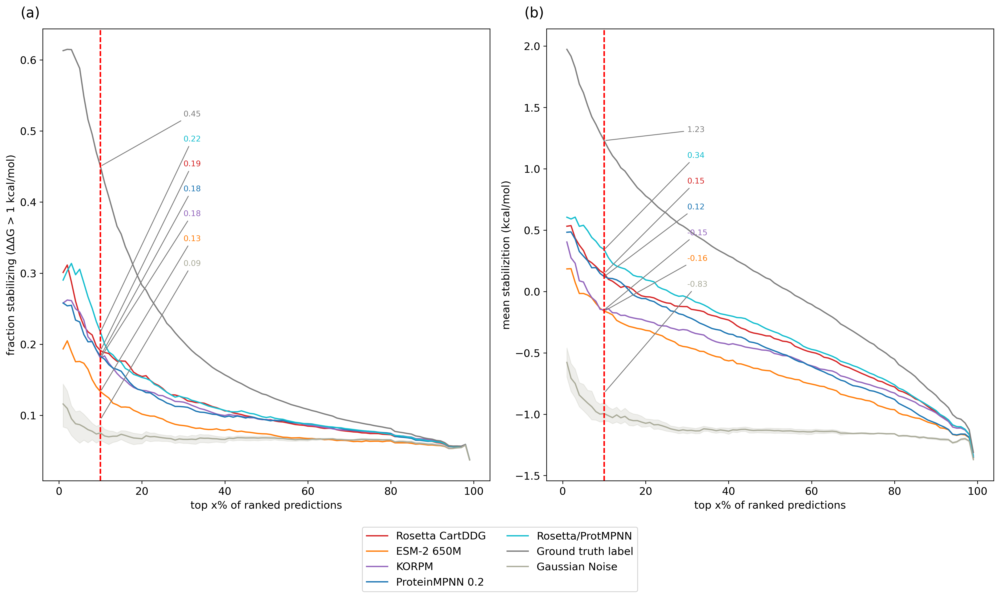

In [7]:
db_class_r = db_class.copy(deep=True)
db_class_r['random_2_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_3_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_4_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_5_dir'] = np.random.normal(loc=0, size=len(db_class_r))
class_result_new = analysis_utils.compute_stats(db_class_r, stats=('aumsc', 'auppc'), measurements=['ddG'], grouper='cluster', n_bootstraps=0)
crn = class_result_new.reset_index()
crn.loc[crn['model'].str.contains('random'), 'model'] = 'random_dir'
crn = crn.set_index(['measurement', 'model_type', 'model'])
crn
analysis_utils.recovery_curves(crn, ['mpnn_20_00_dir', 'cartesian_ddg_dir', 'mpnn_rosetta_dir', 'korpm_dir', 'esm2_650M_dir', 'ddG_dir', 'random_dir'], spacing=0.07, measurements=['ddG'], plots=['auppc', 'aumsc']) #'q3421_pslm_rfa_5_dir', 'stability-oracle_dir',

# < 4 minutes

### Recovery Curves (Visualization of Stable Mutant Enrichment, Supplementary Figure 6)

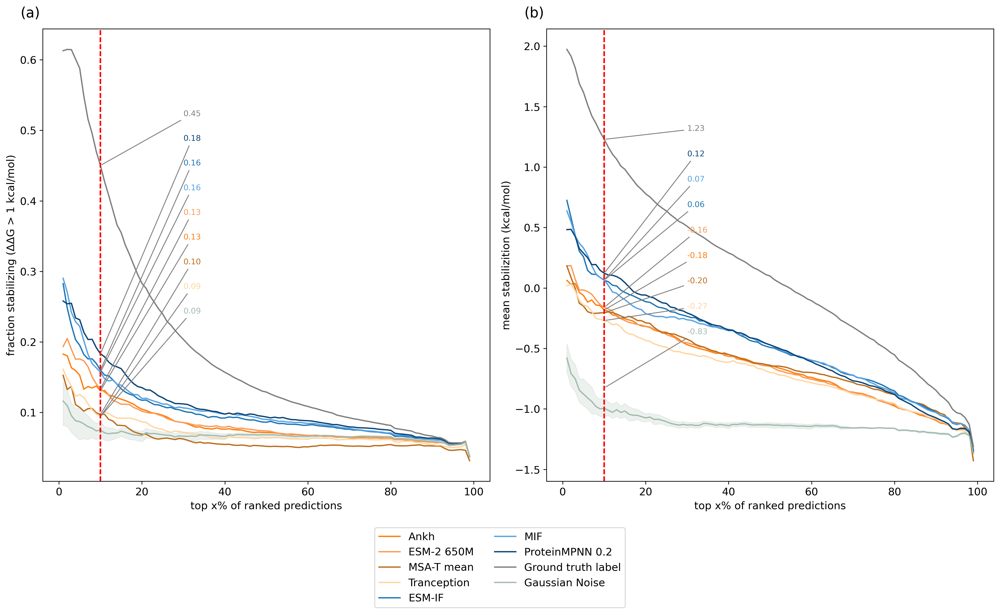

In [8]:
analysis_utils.recovery_curves(crn, ['mpnn_20_00_dir', 'mif_dir', 'esmif_multimer_dir', 'ankh_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'tranception_dir', 'mutcomputex_dir', 'ddG_dir', 'random_dir'], spacing=0.07, measurements=['ddG'], plots=['auppc', 'aumsc'])

### Bootstrapped Q3421 Analysis (Used for Figure 1 and Extended Data Table 1)

In [9]:
summ = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'tp', 'fp', 'tn', 'fn', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'recall@k0.0', 'recall@k1.0'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=100, quiet=True)
tmp1 = summ.reset_index()
#tmp1.to_csv('../data/extended/q3421_extended_bootstrapped.csv')

# < 1 minute

In [10]:
remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

remap_cols = {'auprc': 'AUPRC', 'spearman': 'Spearman\'s ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 'ndcg': 'NDCG',
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 'mean_stabilization': 'Mean Stabilization',
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR', 'n': 'n', 'MCC': 'MCC', 'recall@k1.0': 'Recall @ k'}

new_remap_cols = {}
for key, value in remap_cols.items():
    new_remap_cols[key + '_mean'] = value + ' mean'
    new_remap_cols[key + '_std'] = value + ' stdev'

s2 = tmp1.sort_values('net_stabilization_mean', ascending=False).dropna(how='all', axis=1).reset_index()
s3 = s2.loc[s2['model'].isin(original_pred_cols_reduced + [
            'random_dir', 
            'ddG_dir', 
            'q3421_pslm_rfa_2_dir', 
            'q3421_pslm_rfa_3_dir', 
            'q3421_pslm_rfa_4_dir',
            'q3421_pslm_rfa_5_dir',
            'mpnn_rosetta_dir'])
            ].drop('measurement', axis=1)

s4 = s3[['model_type', 'model', 
    'recall@k1.0_mean', 'recall@k1.0_std',
    'ndcg_mean', 'ndcg_std',
    'weighted_ndcg_mean', 'weighted_ndcg_std',
    'spearman_mean', 'spearman_std',
    'weighted_spearman_mean', 'weighted_spearman_std',
    'auprc_mean', 'auprc_std', 
    'MCC_mean', 'MCC_std', 
    'mean_stabilization_mean', 'mean_stabilization_std', 
    'net_stabilization_mean', 'net_stabilization_std',
    ]]
s4['model'] = s4['model'].map(remap_names_2)
s5 = s4.set_index(['model_type', 'model'])
s5.columns = [new_remap_cols[c] for c in s5.columns]
s5
# Iterate over the DataFrame and update the mean columns
for column in s5.columns:
    if 'mean' in column:
        stdev_column = column.replace('mean', 'stdev')
        s5[column] = s5[column].round(3).astype(str) + ' ± ' + s5[stdev_column].round(2).astype(str)

# Drop the standard deviation columns
s5 = s5[[col for col in s5.columns if 'stdev' not in col]]
s5.columns = [col[:-5] for col in s5.columns]
s6 = s5.reset_index().rename({'model_type': 'Model Type', 'model': 'Model'}, axis=1)
#s6.to_csv('../data/extended/q3421_extended_bootstrapped_formatted.csv')
s6

,Model Type,Model,Recall @ k,NDCG,wNDCG,Spearman's ρ,wρ,AUPRC,MCC,Mean Stabilization,Net Stabilization
0,unknown,ΔΔG label,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.082 ± 0.22,1589.282 ± 519.01
1,structural,Rosetta/ProtMPNN,0.315 ± 0.03,0.668 ± 0.05,0.719 ± 0.02,0.605 ± 0.05,0.487 ± 0.04,0.532 ± 0.03,0.342 ± 0.03,0.326 ± 0.16,285.745 ± 157.36
2,ensemble,Ensemble 2 Feats,0.271 ± 0.03,0.654 ± 0.04,0.713 ± 0.02,0.501 ± 0.05,0.436 ± 0.03,0.486 ± 0.03,0.315 ± 0.02,0.212 ± 0.17,172.225 ± 145.0
3,ensemble,Ensemble 4 Feats,0.278 ± 0.04,0.662 ± 0.05,0.725 ± 0.02,0.56 ± 0.04,0.484 ± 0.03,0.498 ± 0.04,0.331 ± 0.03,0.156 ± 0.16,158.998 ± 210.79
4,ensemble,Ensemble 3 Feats,0.294 ± 0.03,0.665 ± 0.05,0.723 ± 0.02,0.54 ± 0.04,0.476 ± 0.03,0.488 ± 0.04,0.33 ± 0.03,0.167 ± 0.21,151.054 ± 248.45
5,structural,ProteinMPNN 0.1,0.243 ± 0.03,0.648 ± 0.04,0.708 ± 0.02,0.46 ± 0.06,0.394 ± 0.03,0.467 ± 0.03,0.297 ± 0.03,0.118 ± 0.17,104.09 ± 152.64
6,ensemble,Ensemble 5 Feats,0.235 ± 0.03,0.652 ± 0.05,0.718 ± 0.02,0.576 ± 0.04,0.491 ± 0.03,0.493 ± 0.04,0.313 ± 0.03,0.098 ± 0.16,99.294 ± 236.87
7,biophysical,Rosetta CartDDG,0.297 ± 0.04,0.647 ± 0.05,0.704 ± 0.02,0.55 ± 0.05,0.432 ± 0.03,0.477 ± 0.04,0.329 ± 0.03,0.061 ± 0.17,74.947 ± 248.62
8,structural,ESM-IF,0.213 ± 0.03,0.652 ± 0.04,0.67 ± 0.02,0.448 ± 0.06,0.396 ± 0.03,0.437 ± 0.03,0.244 ± 0.03,0.087 ± 0.23,74.55 ± 181.94
9,evolutionary,Tranception reweighted,0.132 ± 0.02,0.583 ± 0.04,0.603 ± 0.02,0.279 ± 0.07,0.217 ± 0.04,0.339 ± 0.03,0.152 ± 0.03,0.224 ± 0.24,54.716 ± 62.03


### Visualization of Prediction Distributions (Supplementary Figure 1)

      cluster  variable      value
238        82  ESM-2 3B  -6.211802
239        82  ESM-2 3B   2.548442
240        82  ESM-2 3B  -4.176293
415        77  ESM-2 3B -10.240904
416        75  ESM-2 3B  -6.300497
...       ...       ...        ...
6727       80       ΔΔG  -2.260000
6728       80       ΔΔG  -6.930000
6729       80       ΔΔG  -2.040000
6730       80       ΔΔG   0.150000
6731       80       ΔΔG  -1.850000

[742 rows x 3 columns]


<Axes: xlabel='cluster', ylabel='value'>

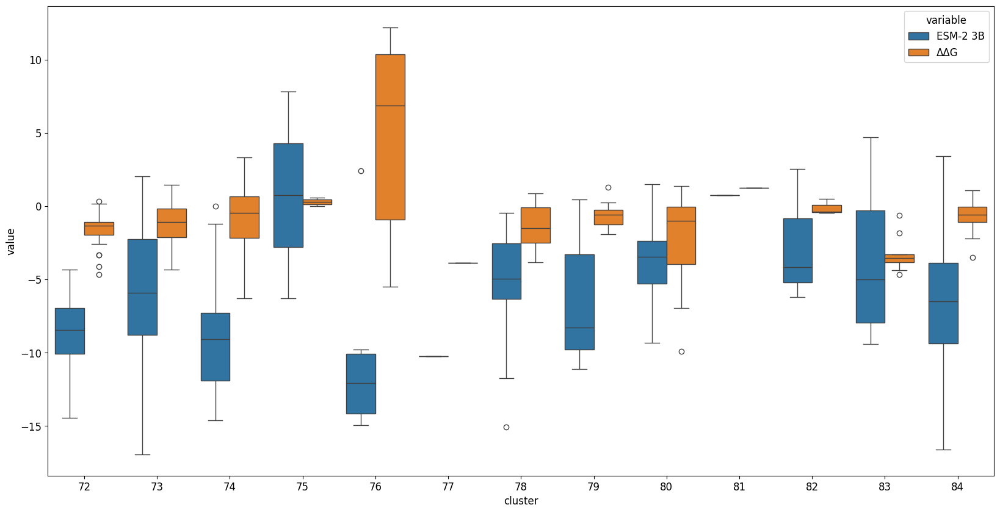

In [11]:
db_plot = db_class.copy(deep=True)
db_plot = db_plot.loc[~db_plot['ddG_dir'].isna()]
db_plot = db_plot.rename({'ddG_dir': 'ΔΔG', 'esm2_3B_dir': 'ESM-2 3B'}, axis=1)
db_plot = db_plot[['cluster', 'ESM-2 3B', 'ΔΔG']].melt(id_vars='cluster')
db_plot = db_plot.loc[db_plot['cluster']>71]
print(db_plot)
fig, ax = plt.subplots(figsize=(20, 10))
sns.boxplot(db_plot, x='cluster', y='value', hue='variable', ax=ax)

### Supplementary Table 5

In [12]:
summ2 = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'tp', 'fp', 'tn', 'fn', 'auprc', 'spearman', 'accuracy', 'mse', 'net_stabilization', 'mean_stabilization', 'precision', 'recall'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=5, quiet=True)
tmp2 = summ2.reset_index()

# < 1 minute

In [13]:
remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

remap_cols = {'auprc': 'AUPRC', 'spearman': 'Spearman\'s ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 'ndcg': 'NDCG',
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 'mean_stabilization': 'Mean Stabilization',
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR', 'n': 'n', 'MCC': 'MCC', 'recall@k1.0': 'Recall @ k',
    'mean_squared_error': 'MSE'}

new_remap_cols = {}
for key, value in remap_cols.items():
    new_remap_cols[key + '_mean'] = value + ' mean'
    new_remap_cols[key + '_std'] = value + ' stdev'

s2 = summ2.sort_values('mean_squared_error_mean', ascending=True).dropna(how='all', axis=1).reset_index()
s3 = s2.loc[s2['model'].isin(original_pred_cols_reduced + ['random_dir', 'ddG_dir'])].drop('measurement', axis=1)
s4 = s3[['model_type', 'model', 
    'mean_squared_error_mean', 'mean_squared_error_std',
    'accuracy_mean', 'accuracy_std',
    'spearman_mean', 'spearman_std',
    'weighted_spearman_mean', 'weighted_spearman_std',
    'net_stabilization_mean', 'net_stabilization_std',
    ]]
s4['model'] = s4['model'].map(remap_names_2)
s5 = s4.set_index(['model_type', 'model'])
s5.columns = [new_remap_cols[c] for c in s5.columns]
s5
# Iterate over the DataFrame and update the mean columns
for column in s5.columns:
    if 'mean' in column:
        stdev_column = column.replace('mean', 'stdev')
        s5[column] = s5[column].round(3).astype(str) + ' ± ' + s5[stdev_column].round(2).astype(str)

# Drop the standard deviation columns
s5 = s5[[col for col in s5.columns if 'stdev' not in col]]
s5.columns = [col[:-5] for col in s5.columns]
s6 = s5.reset_index().rename({'model_type': 'Model Type', 'model': 'Model'}, axis=1)
s6

,Model Type,Model,MSE,Accuracy,Spearman's ρ,wρ,Net Stabilization
0,unknown,ΔΔG label,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1597.724 ± 419.9
1,potential,KORPM,3.73 ± 1.11,0.731 ± 0.01,0.472 ± 0.04,0.337 ± 0.04,-603.236 ± 532.7
2,structural,ESM-IF,5.265 ± 0.89,0.786 ± 0.02,0.5 ± 0.03,0.406 ± 0.03,138.936 ± 269.2
3,structural,ESM-IF(M),5.271 ± 0.89,0.78 ± 0.03,0.475 ± 0.05,0.378 ± 0.04,47.974 ± 274.16
4,evolutionary,Tranception,5.302 ± 0.89,0.79 ± 0.03,0.338 ± 0.07,0.213 ± 0.02,88.798 ± 66.9
5,evolutionary,Tranception reweighted,5.305 ± 0.89,0.79 ± 0.03,0.344 ± 0.08,0.227 ± 0.02,116.58 ± 97.5
6,unknown,Gaussian Noise,6.449 ± 0.87,0.488 ± 0.01,-0.022 ± 0.03,0.007 ± 0.02,-4494.348 ± 1935.29
7,structural,ProteinMPNN 0.3,6.835 ± 0.8,0.784 ± 0.02,0.539 ± 0.04,0.402 ± 0.03,16.09 ± 367.52
8,structural,ProteinMPNN 0.2,7.369 ± 0.91,0.786 ± 0.02,0.535 ± 0.03,0.4 ± 0.03,101.382 ± 332.14
9,structural,ProteinMPNN 0.1,8.253 ± 1.07,0.796 ± 0.02,0.52 ± 0.03,0.378 ± 0.04,137.528 ± 292.32


### Figure 1

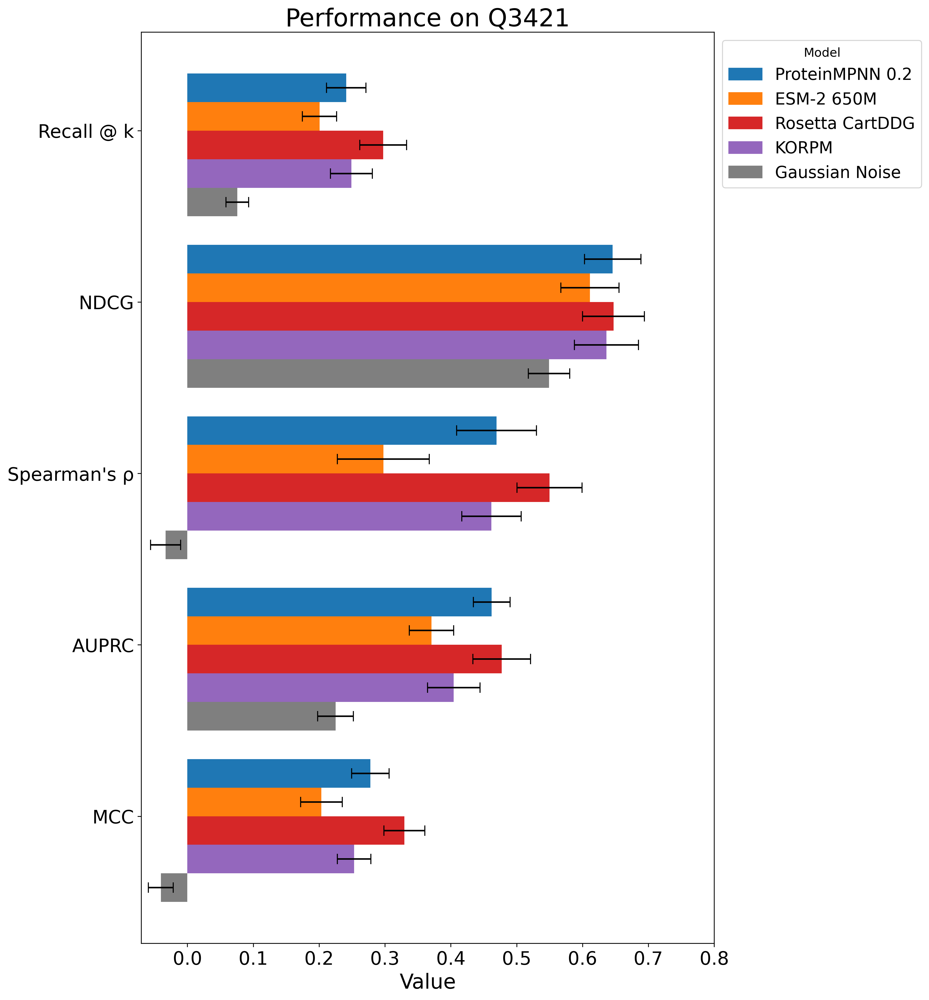

In [14]:
import importlib
importlib.reload(analysis_utils)

tmp3 = tmp1.copy(deep=True)

remap_cols = {'auprc': 'AUPRC', 'spearman': 'Spearman\'s ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 'ndcg': 'NDCG',
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 'mean_stabilization': 'Mean Stabilization',
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR', 'n': 'n', 'MCC': 'MCC', 'recall@k1.0': 'Recall @ k'}

new_remap_cols = {}
for key, value in remap_cols.items():
    new_remap_cols[key + '_mean'] = value + ' mean'
    new_remap_cols[key + '_std'] = value + ' stdev'

s2 = tmp3.sort_values('spearman_mean', ascending=False).dropna(how='all', axis=1).reset_index()
s4 = s2.loc[s2['model'].isin(original_pred_cols_reduced + ['random_dir', 'ddG_dir', 'mpnn_rosetta_dir'])]
s5 = s4

tmp2 = s5[[ 'model',  
            'MCC_mean', 'MCC_std',
            'auprc_mean', 'auprc_std',
            #'weighted_spearman_mean', 'weighted_spearman_std',
            'spearman_mean', 'spearman_std',
            #'weighted_ndcg_mean', 'weighted_ndcg_std',
            'ndcg_mean', 'ndcg_std',
            'recall@k1.0_mean', 'recall@k1.0_std', 
            ]].set_index('model')

tmp2.columns = [new_remap_cols[c] for c in tmp2.columns]
tmp2 = tmp2.reset_index().drop_duplicates()

analysis_utils.make_bar_chart(tmp2, models=['mpnn_20_00', 'esm2_650M',  'cartesian_ddg', 'korpm', 'random'], title='Q3421', xlim=(-0.07, 0.8), figsize=(10, 16)) #'stability-oracle', 'DDGun3D', 'MAESTRO', 

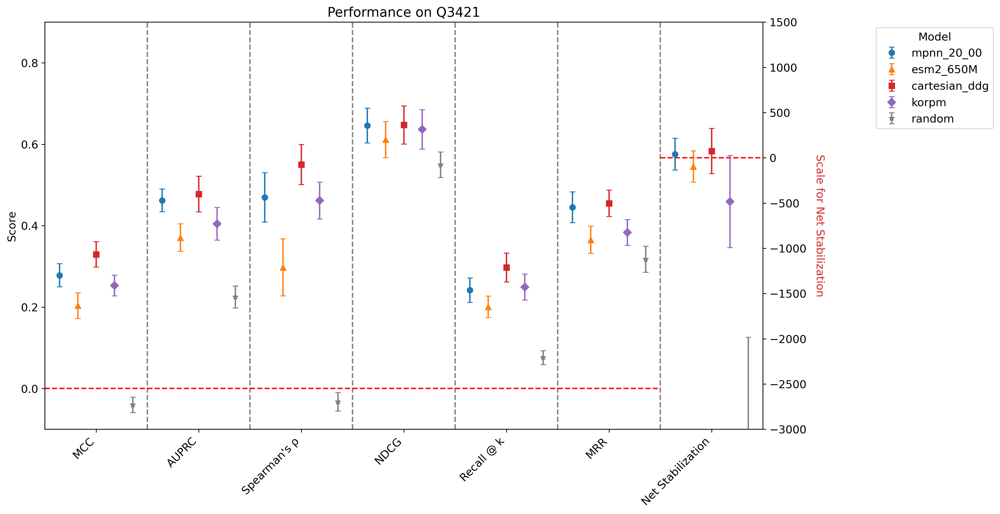

In [15]:
import importlib
importlib.reload(analysis_utils)

tmp3 = tmp1.copy(deep=True)

remap_cols = {'auprc': 'AUPRC', 'spearman': 'Spearman\'s ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 'ndcg': 'NDCG',
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 'mean_stabilization': 'Mean Stabilization',
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR', 'n': 'n', 'MCC': 'MCC', 'recall@k1.0': 'Recall @ k'}

new_remap_cols = {}
for key, value in remap_cols.items():
    new_remap_cols[key + '_mean'] = value + ' mean'
    new_remap_cols[key + '_std'] = value + ' stdev'

s2 = tmp3.sort_values('spearman_mean', ascending=False).dropna(how='all', axis=1).reset_index()
s4 = s2.loc[s2['model'].isin(original_pred_cols_reduced + ['random_dir', 'ddG_dir', 'mpnn_rosetta_dir'])]
s5 = s4

tmp2 = s5[[ 'model',  
            'MCC_mean', 'MCC_std',
            'auprc_mean', 'auprc_std',
            #'weighted_spearman_mean', 'weighted_spearman_std',
            'spearman_mean', 'spearman_std',
            #'weighted_ndcg_mean', 'weighted_ndcg_std',
            'ndcg_mean', 'ndcg_std',
            'recall@k1.0_mean', 'recall@k1.0_std',
            'mean_reciprocal_rank_mean', 'mean_reciprocal_rank_std',
            'net_stabilization_mean', 'net_stabilization_std'
            ]].set_index('model')

tmp2.columns = [new_remap_cols[c] for c in tmp2.columns]
tmp2 = tmp2.reset_index().drop_duplicates()

analysis_utils.make_scatter_chart(tmp2, models=['mpnn_20_00', 'esm2_650M',  'cartesian_ddg', 'korpm', 'random'], title='Q3421', ylim=(-0.1, 0.9), figsize=(14, 8), use_dual_y_axis=True, right_y_lim=(-3000, 1500)) #'stability-oracle', 'DDGun3D', 'MAESTRO', 

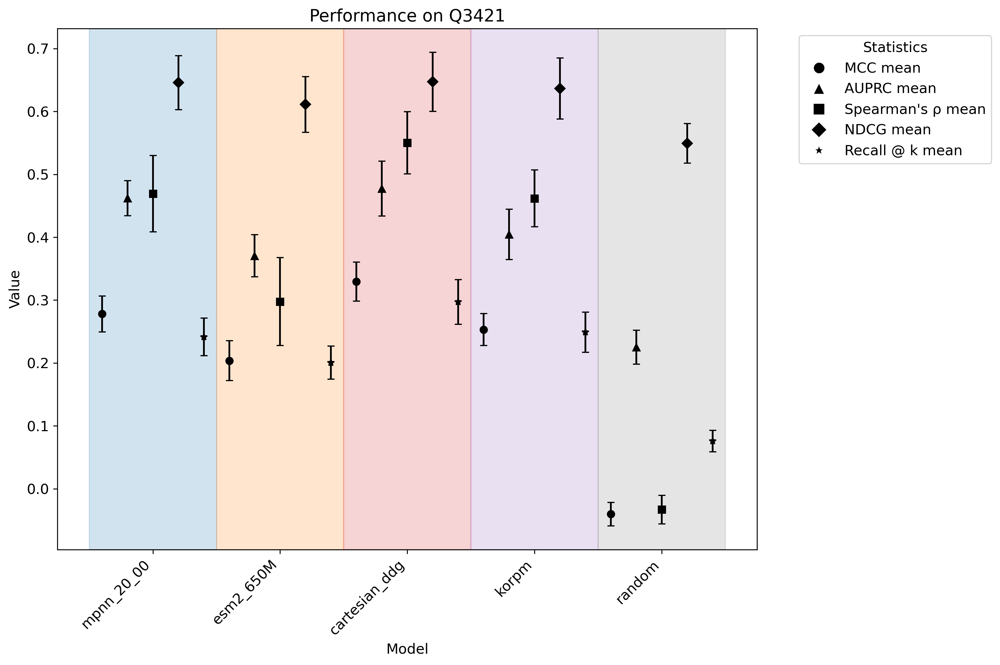

In [16]:
import importlib
importlib.reload(analysis_utils)

tmp3 = tmp1.copy(deep=True)

remap_cols = {'auprc': 'AUPRC', 'spearman': 'Spearman\'s ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 'ndcg': 'NDCG',
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 'mean_stabilization': 'Mean Stabilization',
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR', 'n': 'n', 'MCC': 'MCC', 'recall@k1.0': 'Recall @ k'}

new_remap_cols = {}
for key, value in remap_cols.items():
    new_remap_cols[key + '_mean'] = value + ' mean'
    new_remap_cols[key + '_std'] = value + ' stdev'

s2 = tmp3.sort_values('spearman_mean', ascending=False).dropna(how='all', axis=1).reset_index()
s4 = s2.loc[s2['model'].isin(original_pred_cols_reduced + ['random_dir', 'ddG_dir', 'mpnn_rosetta_dir'])]
s5 = s4

tmp2 = s5[[ 'model',  
            'MCC_mean', 'MCC_std',
            'auprc_mean', 'auprc_std',
            #'weighted_spearman_mean', 'weighted_spearman_std',
            'spearman_mean', 'spearman_std',
            #'weighted_ndcg_mean', 'weighted_ndcg_std',
            'ndcg_mean', 'ndcg_std',
            'recall@k1.0_mean', 'recall@k1.0_std', 
            ]].set_index('model')

tmp2.columns = [new_remap_cols[c] for c in tmp2.columns]
tmp2 = tmp2.reset_index().drop_duplicates()

analysis_utils.make_scatter_chart_colored(tmp2, models=['mpnn_20_00', 'esm2_650M',  'cartesian_ddg', 'korpm', 'random'], title='Q3421', ylim=(-0.07, 0.8), figsize=(12, 8)) #'stability-oracle', 'DDGun3D', 'MAESTRO', 

In [17]:
db_new = pd.read_csv('~/PSLMs/data/inference/tranception_results.csv', index_col=0)
db_new = db_new.rename({'tranception_weights_dir': 'tranception_new_dir', 'runtime_tranception_weights_dir': 'runtime_tranception_new_dir'}, axis=1)
db['uid3'] = db['code'] + '_' + (db['position']-db['offset_up']).astype(str) + db['mutation']
db_new = db.reset_index().set_index('uid3').join(db_new).reset_index().set_index('uid')
db_new[['tranception_new_dir']]

,tranception_new_dir
uid,
1A23_30S,-0.109360
1A23_32L,-0.059789
1A23_32S,-0.032388
1A23_32Y,-0.039155
1A23_33S,-0.075979
...,...
5CRO_26L,-0.105731
5CRO_26Q,-0.045138
5CRO_26V,-0.045453


### Additional Figure describing correlation between predictions and scores of two selected models

     code  obs type mpnn_20_00_dir cartesian_ddg_dir     marker
0    1A23    5  ddG            0.3               0.5   Bacteria
1    1A43    5  ddG           -0.3               0.0    Viruses
2    1A5E    3  ddG           -1.0               0.5  Eukaryota
3    1AAR   10  ddG       0.054545          0.757576  Eukaryota
4    1AG2    9  ddG       0.416667               0.5  Eukaryota
5    1AJ3   67  ddG       0.489555           0.64322  Eukaryota
6    1AKK    4  ddG            0.8               1.0  Eukaryota
8    1AMQ   20  ddG       0.589917          0.240783   Bacteria
9    1ANK    4  ddG            0.8              -0.6   Bacteria
10   1AON    3  ddG       0.866025               0.0   Bacteria
11   1APS   27  ddG       0.504505          0.176821  Eukaryota
12   1ARR   64  ddG       0.238276          0.392446    Viruses
13   1AYF   11  ddG      -0.145455          0.727273  Eukaryota
14   1B26    3  ddG            1.0               0.5   Bacteria
16   1BNI  171  ddG       0.497312      

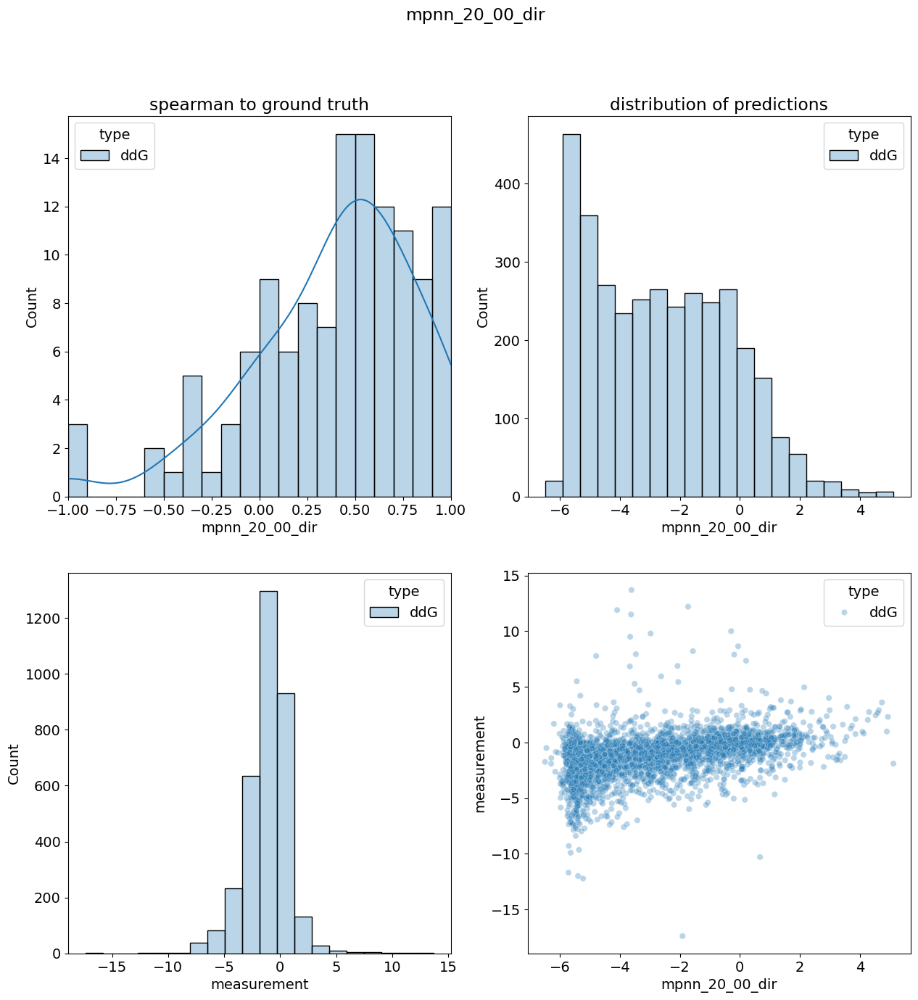

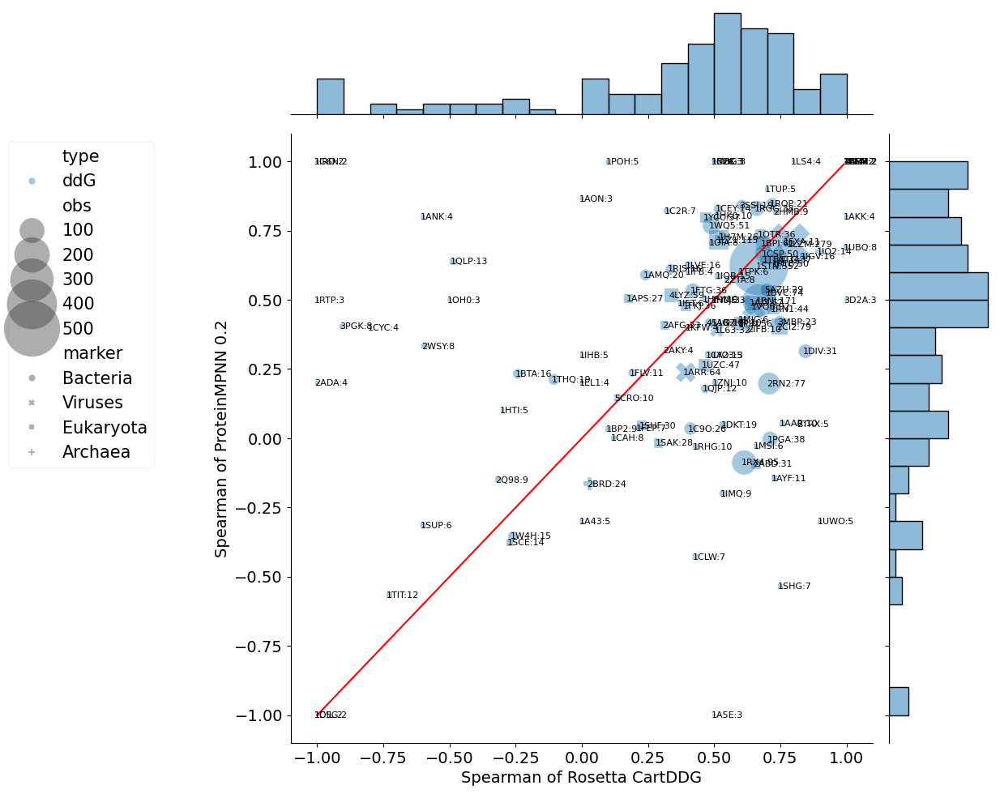

mpnn_20_00_dir cartesian_ddg_dir
ddG n_total                       3409              3409
    ungrouped_spearman        0.484622          0.562192
    n_proteins                     148               148
    n_proteins_spearman            125               125
    avg_spearman              0.392649           0.35918
    weighted_spearman         0.396629          0.429966
    runtime (s)                    NaN               NaN

In [18]:
db_class_2 = db_class.copy(deep=True)
#db_class_2 = db_class_2.join(db_new[['tranception_new_dir']])
db_class_2['ddG_dir'] = db_class_2['ddG']
db_class_2['marker'] = db['origin']
db_class_2['code'] = db_class_2.reset_index('uid2').index.str[:4]
analysis_utils.correlations(db_class_2, None, stat='spearman', 
    score_name='mpnn_20_00_dir', score_name_2='cartesian_ddg_dir', min_obs=1, group=True, plot=True, out=True, runtime=False)

In [19]:
db_class_2

,,mif_dir,mifst_dir,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,esm2_3B_dir,esmif_multimer_dir,esm2_15B_half_dir,esmif_monomer_dir,tranception_weights_dir,...,q3421_all_rfa_5_dir,q3421_all_rfa_6_dir,q3421_all_rfa_7_dir,q3421_all_rfa_8_dir,q3421_all_rfa_9_dir,q3421_all_rfa_10_dir,q3421_all_rfa_11_dir,q3421_all_rfa_12_dir,marker,code
uid,uid2,,,,,,,,,,,,,,,,,,,,,
1A23_30S,1A23_30S,1.864485,-6.805952,1.810260,2.009976,-1.147786,-11.571676,-0.043713,-11.668701,-0.043712,-0.108554,...,-0.222403,-0.222403,-0.222403,-0.222403,-0.222403,-0.222403,-0.277215,-0.302506,Bacteria,1A23
1A23_32L,1A23_32L,1.119251,-7.800102,0.095243,2.145201,-0.386124,-13.755667,-0.042389,-13.076172,-0.042389,-0.059629,...,0.295735,0.295735,0.295735,0.295735,0.295735,0.295735,0.251233,0.238775,Bacteria,1A23
1A23_32S,1A23_32S,-0.854073,-5.414868,0.301296,0.877654,0.752050,-8.291791,-0.029983,-10.436035,-0.029983,-0.032270,...,-0.200724,-0.200724,-0.200724,-0.200724,-0.200724,-0.200724,-0.199677,-0.204368,Bacteria,1A23
1A23_32Y,1A23_32Y,1.528646,-3.414633,-0.108550,0.747990,0.164768,-8.121881,-0.020219,-9.415039,-0.020219,-0.039056,...,0.362579,0.362579,0.362579,0.362579,0.362579,0.362579,0.352912,0.346892,Bacteria,1A23
1A23_33S,1A23_33S,0.348253,-5.093968,1.341104,-0.472430,0.157554,-12.002896,-0.024960,-12.722168,-0.024960,-0.076600,...,-0.349678,-0.349678,-0.349678,-0.349678,-0.349678,-0.349678,-0.335882,-0.346903,Bacteria,1A23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5CRO_26L,5CRO_26L,-0.438132,-0.126320,0.130304,0.337329,0.194948,-3.150103,-0.038055,-2.374512,-0.037373,-0.095336,...,-0.077595,-0.077595,-0.077595,-0.077595,-0.077595,-0.077595,-0.078937,-0.104952,Viruses,5CRO
5CRO_26Q,5CRO_26Q,0.140129,0.700469,1.668023,1.180899,1.713544,-2.508844,-0.006247,-2.625244,-0.004605,-0.045372,...,0.340035,0.340035,0.340035,0.340035,0.340035,0.340035,0.351623,0.336355,Viruses,5CRO
5CRO_26V,5CRO_26V,0.501243,1.538724,1.425710,0.879769,0.474643,-3.204980,0.032355,-2.228027,0.037691,-0.047876,...,0.285702,0.285702,0.285702,0.285702,0.285702,0.285702,0.277873,0.264972,Viruses,5CRO


### Figure 4 a&b

  0%|          | 0/5 [00:00<?, ?it/s]

['ddG_dir', 'q3421_all_rfa_5_dir', 'q3421_pslm_rfa_5_dir', 'cartesian_ddg_dir', 'esmif_multimer_dir', 'mif_dir', 'mpnn_20_00_dir', 'korpm_dir', 'mifst_dir', 'esm2_650M_dir', 'ankh_dir', 'esm2_15B_half_dir', 'tranception_dir', 'msa_transformer_mean_dir', 'random_dir']
class
0 >= ΔΔG > -1.5    810
ΔΔG <= -1.5        660
ΔΔG > 0            468
Name: n, dtype: int64


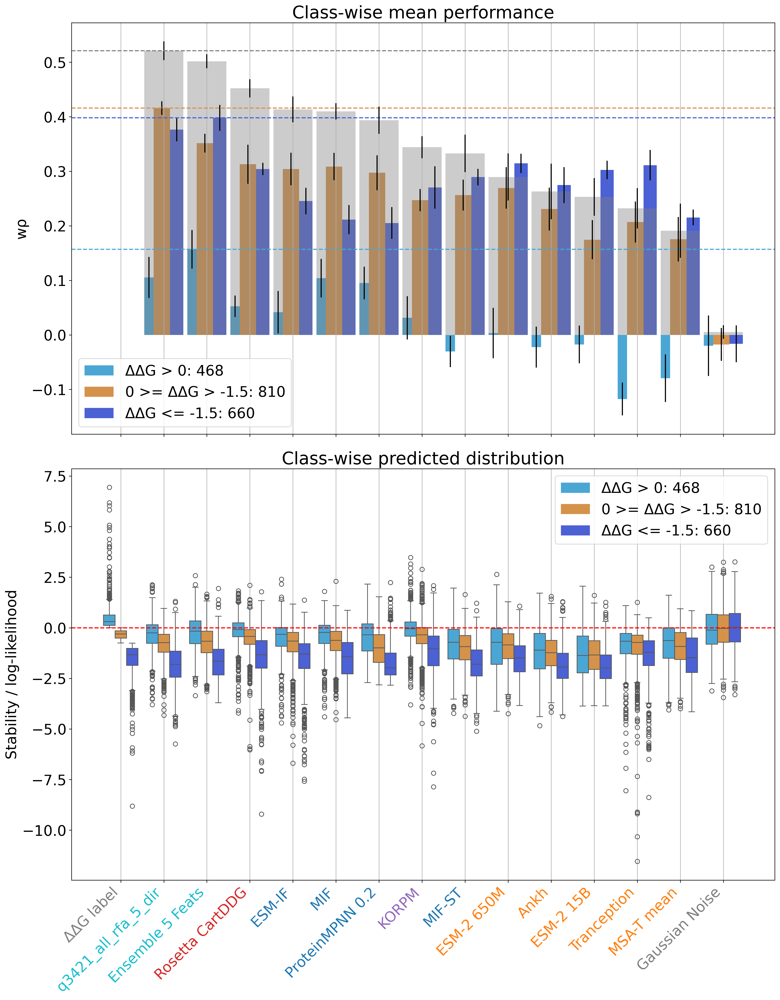

In [20]:
subset = ['q3421_pslm_rfa_5_dir',
          'q3421_all_rfa_5_dir',
            #'mpnn_rosetta_dir',
            'cartesian_ddg_dir',
            'korpm_dir',
            'msa_transformer_mean_dir',
            'tranception_dir',
            'esm2_650M_dir',
            'esm2_15B_half_dir',
            'ankh_dir',
            'esmif_multimer_dir',
            #'mpnn_10_00_dir',
            'mpnn_20_00_dir',
            #'mpnn_30_00_dir',
            'mif_dir',
            'mifst_dir',
            #'mutcomputex_dir',
            #'stability-oracle_dir',
            'random_dir',
            'ddG_dir']

db_complete = db_class.join(db[[c for c in db.columns if not c in db_class.columns]], how='left')
db_complete['ddG_dir'] = db_complete['ddG']
db_complete['ΔΔG'] = db_complete['ddG']
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]

current_feats = ['ΔΔG', 'ddG']
# fillna only applies to a handful of predictions from Stability Oracle
db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']].fillna(0)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'ΔΔG', 
                        split_col_2 = None, 
                        threshold_1 = 0, 
                        threshold_2 = -1.5, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps= 5,
                        count_muts = True,
                        subset = subset,
                        grouper = 'cluster'
                        )  
# < 10 seconds

In [21]:
db_complete['conservation']

uid       uid2    
1A23_30S  1A23_30S    98.824080
1A23_32L  1A23_32L    33.373224
1A23_32S  1A23_32S    33.373224
1A23_32Y  1A23_32Y    33.373224
1A23_33S  1A23_33S    98.163276
                        ...    
5CRO_26L  5CRO_26L     1.154930
5CRO_26Q  5CRO_26Q     1.154930
5CRO_26V  5CRO_26V     1.154930
5CRO_26W  5CRO_26W     1.154930
5CRO_36S  5CRO_36S    34.845070
Name: conservation, Length: 3421, dtype: float64

### Figure 4 c&d

  0%|          | 0/5 [00:00<?, ?it/s]

conservation > 80% : 293
conservation <= 80% : 1667
['ddG_dir', 'q3421_all_rfa_5_dir', 'q3421_pslm_rfa_5_dir', 'cartesian_ddg_dir', 'mif_dir', 'mpnn_20_00_dir', 'esmif_multimer_dir', 'korpm_dir', 'mifst_dir', 'esm2_650M_dir', 'ankh_dir', 'esm2_15B_half_dir', 'tranception_dir', 'msa_transformer_mean_dir', 'random_dir']
class
conservation <= 80    1667
conservation > 80      293
Name: n, dtype: int64


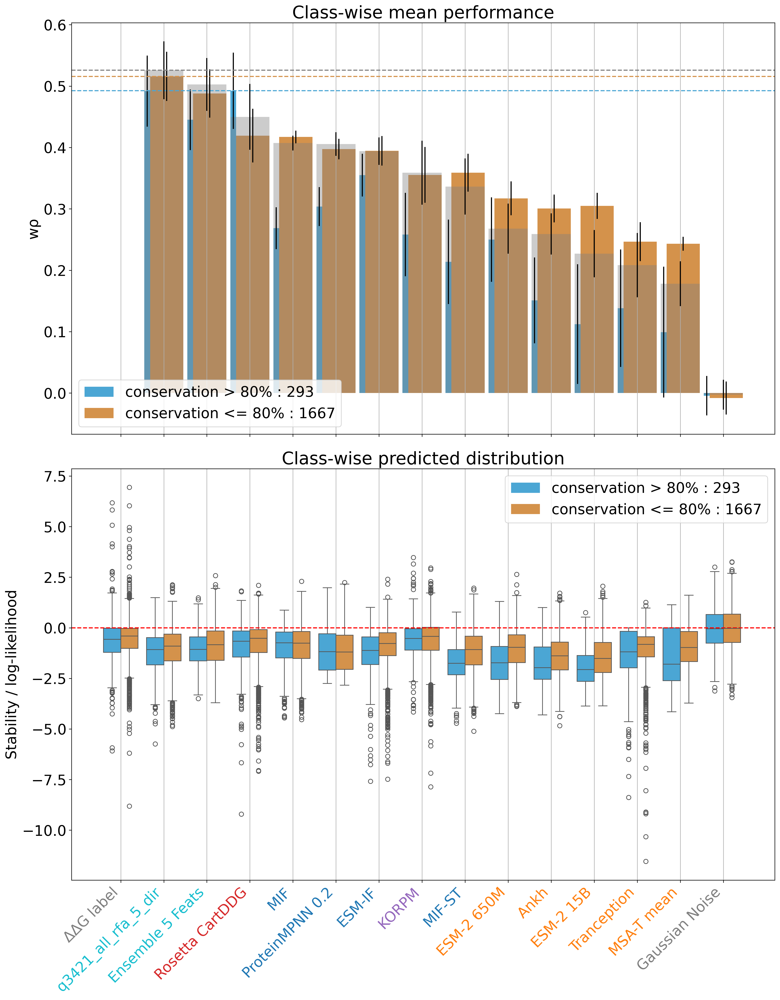

In [22]:
importlib.reload(analysis_utils)
current_feats = ['conservation', 'ddG']
db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']]
db_fig = db_fig.fillna(0)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'conservation', 
                        split_col_2 = None, 
                        threshold_1 = 80, 
                        threshold_2 = None, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps= 5,
                        count_muts = True,
                        subset=subset,
                        grouper='cluster'
                        )
# < 10 seconds

### Extended Data Figure 3

  0%|          | 0/5 [00:00<?, ?it/s]

['ddG_dir', 'q3421_pslm_rfa_5_dir', 'cartesian_ddg_dir', 'mif_dir', 'mpnn_30_00_dir', 'mpnn_10_00_dir', 'esmif_multimer_dir', 'korpm_dir', 'mifst_dir', 'esm2_650M_dir', 'ankh_dir', 'esm2_15B_half_dir', 'tranception_dir', 'msa_transformer_mean_dir', 'random_dir']
class
1 >= delta_vol > -1     598
delta_vol <= -1        1246
delta_vol > 1           398
Name: n, dtype: int64


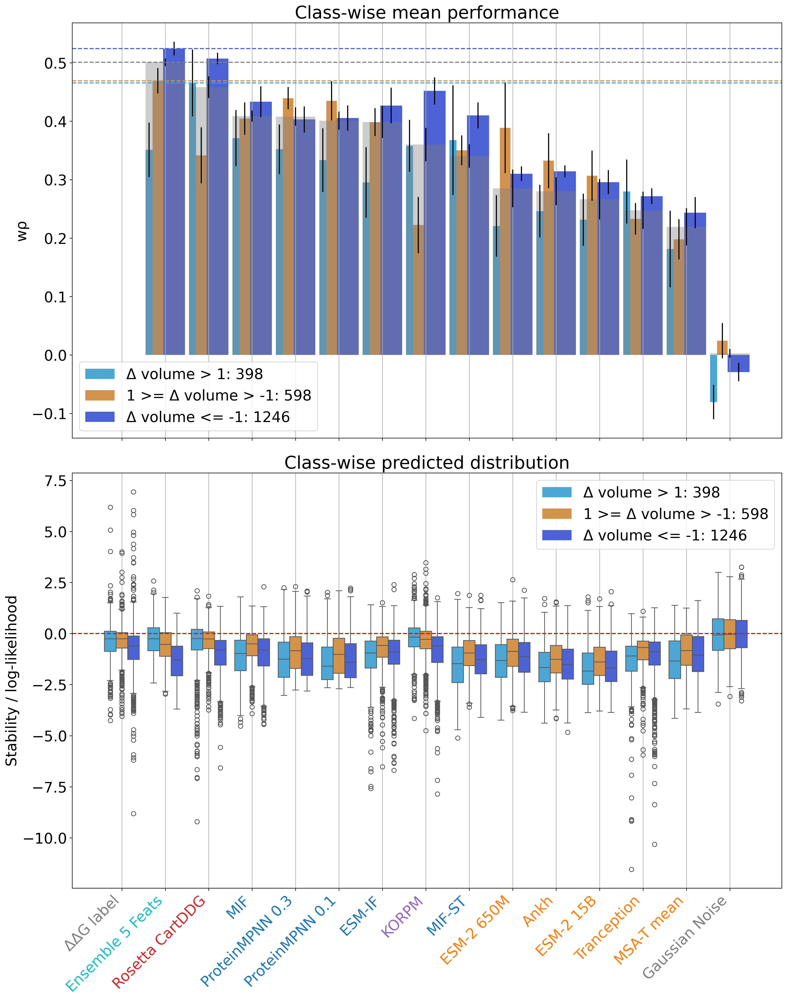

In [23]:
subset = ['q3421_pslm_rfa_5_dir',
            #'mpnn_rosetta_dir',
            'cartesian_ddg_dir',
            'korpm_dir',
            'msa_transformer_mean_dir',
            'tranception_dir',
            'esm2_650M_dir',
            'esm2_15B_half_dir',
            'ankh_dir',
            'esmif_multimer_dir',
            'mpnn_10_00_dir',
            #'mpnn_20_00_dir',
            'mpnn_30_00_dir',
            'mif_dir',
            'mifst_dir',
            #'mutcomputex_dir',
            #'stability-oracle_dir',
            'random_dir',
            'ddG_dir']

# Figure 1 c + d

db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']]
db_fig = db_fig.rename({'delta_vol_dir': 'delta_vol'}, axis=1)
db_fig = db_fig.fillna(0)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'delta_vol', 
                        split_col_2 = None, 
                        threshold_1 = 1, 
                        threshold_2 = -1, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps=5,
                        count_muts = True,
                        subset=subset,
                        grouper='cluster'
                        )
# < 10 seconds

### Extended Data Figure 4

  0%|          | 0/5 [00:00<?, ?it/s]

['ddG_dir', 'q3421_pslm_rfa_5_dir', 'cartesian_ddg_dir', 'mpnn_30_00_dir', 'esmif_multimer_dir', 'mif_dir', 'mpnn_10_00_dir', 'korpm_dir', 'mifst_dir', 'esm2_650M_dir', 'ankh_dir', 'esm2_15B_half_dir', 'tranception_dir', 'msa_transformer_mean_dir', 'random_dir']
class
delta_kdh <= 0 & rel_ASA <= 0.2    650
delta_kdh <= 0 & rel_ASA > 0.2     473
delta_kdh > 0 & rel_ASA <= 0.2     487
delta_kdh > 0 & rel_ASA > 0.2      822
Name: n, dtype: int64


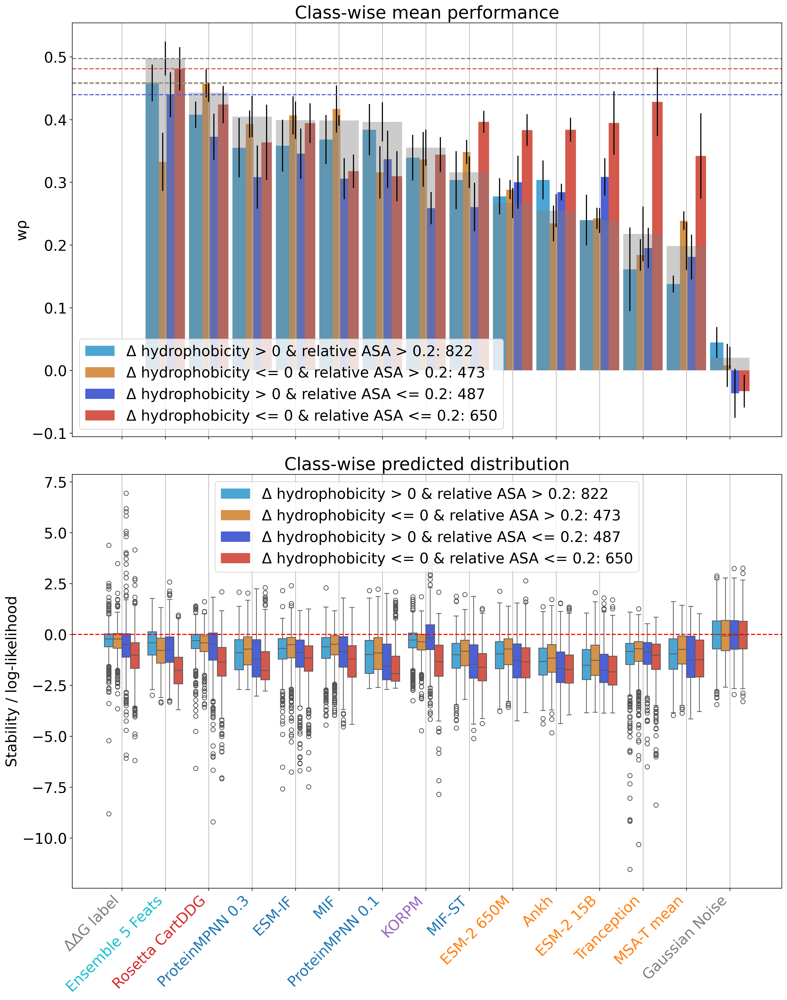

In [24]:
current_feats = ['delta_kdh', 'rel_ASA', 'ddG']
db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']]
l1 = len(db_fig)
db_fig = db_fig.fillna(0)
#db_fig = db_fig.drop(['delta_kdh_dir', 'rel_ASA_dir'], axis=1)
db_fig = db_fig.rename({'delta_kdh_dir': 'delta_kdh', 'rel_ASA_dir': 'rel_ASA'}, axis=1)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'delta_kdh', 
                        split_col_2 = 'rel_ASA', 
                        threshold_1 = 0, 
                        threshold_2 = 0.2, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps=5,
                        count_muts = True,
                        subset=subset,
                        grouper='cluster'
                        )
# < 10 seconds

### Generating the pairwise ensembles used in the model complementarity section

In [25]:
zs_feats = ['rel_ASA', 'delta_kdh', 'delta_vol', 'delta_chg']
models = original_pred_cols_reduced + [c + '_dir' for c in zs_feats]
#models += ['mpnn_mean_dir', 'esmif_mean_dir', 'esm2_mean_dir', 'mif_mean_dir']

#db_summ = db_preds.join(db_ddg).join(db_cluster)
#db_summ = db_class
#db_summ['ddG_dir'] = db_summ['ddG']
#db_summ['random_dir'] = np.random.normal(loc=0, size=len(db_summ))

dfm = db[models + ['cluster', 'ddG']] #db_summ.join(db_feats_2[zs_feats].drop_duplicates(), how='left')
#dfm['code'] = dfm.reset_index('uid2').index.str[:4]
ren = dict(zip(zs_feats, [f+'_dir' for f in zs_feats]))
dfm = dfm.rename(ren, axis=1)
dfr = db_runtimes.copy(deep=True).reset_index(level=0, drop=True)#.drop('uid', axis=1)
dfr['code'] = dfr.index.str[:4]
dfr[['runtime_' + r for r in ['rel_ASA_dir', 'delta_kdh_dir', 'delta_vol_dir', 'delta_chg_dir']]] = 0

weights = [1, 0.5, 0.2] #, -0.2] # could include -0.2 to allow for subtracting models
weights2 = [] # fill in weights to test 3-model ensembles
#weights2 = [0.8, 0.3]

all_cols = []

tmp_preds = []
tmp_runtimes = []
for model1 in models:
    for model2 in models:
        if model1 != model2:
            for weight in weights:
                tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight, name=f'{model1} + {model2} * {weight}'))
                #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model1].max() * weight, name=f'{model1} + {model2} * {weight}'))
                all_cols.append(f'{model1} + {model2} * {weight}')
                tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2], name=f'runtime_'+all_cols[-1]))
                for model3 in models:
                    if model3 != model2:
                    #if (model1.split('_')[0] != model3.split('_')[0]) and (model2.split('_')[0] != model3.split('_')[0]):
                        for weight2 in weights2:
                            tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight + dfm[model3]/dfm[model3].std() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model2].max() * weight + (dfm[model3]-dfm[model3].min())/dfm[model3].max() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            all_cols.append(f'{model1} + {model2} * {weight} + {model3} * {weight2}')
                            #tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2] + dfr['runtime_'+model3], name='runtime_'+all_cols[-1]))

print('concatenating')
dfm = pd.concat([dfm] + tmp_preds, axis=1)
dfr = pd.concat([dfr] + tmp_runtimes, axis=1)
print('joining...')
dfm = dfm.join(dfr.drop('code', axis=1))
dfm

# < 10 seconds

concatenating
joining...


,,mif_dir,mifst_dir,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,esm2_3B_dir,esmif_multimer_dir,esm2_15B_half_dir,esmif_monomer_dir,tranception_weights_dir,...,runtime_delta_chg_dir + cartesian_ddg_dir * 0.2,runtime_delta_chg_dir + rel_ASA_dir * 1,runtime_delta_chg_dir + rel_ASA_dir * 0.5,runtime_delta_chg_dir + rel_ASA_dir * 0.2,runtime_delta_chg_dir + delta_kdh_dir * 1,runtime_delta_chg_dir + delta_kdh_dir * 0.5,runtime_delta_chg_dir + delta_kdh_dir * 0.2,runtime_delta_chg_dir + delta_vol_dir * 1,runtime_delta_chg_dir + delta_vol_dir * 0.5,runtime_delta_chg_dir + delta_vol_dir * 0.2
uid,uid2,,,,,,,,,,,,,,,,,,,,,
1A23_30S,1A23_30S,1.864485,-6.805952,1.810260,2.009976,-1.147786,-11.571676,-0.043713,-11.668701,-0.043712,-0.108554,...,5,0,0,0,0,0,0,0,0,0
1A23_32L,1A23_32L,1.119251,-7.800102,0.095243,2.145201,-0.386124,-13.755667,-0.042389,-13.076172,-0.042389,-0.059629,...,6,0,0,0,0,0,0,0,0,0
1A23_32S,1A23_32S,-0.854073,-5.414868,0.301296,0.877654,0.752050,-8.291791,-0.029983,-10.436035,-0.029983,-0.032270,...,6,0,0,0,0,0,0,0,0,0
1A23_32Y,1A23_32Y,1.528646,-3.414633,-0.108550,0.747990,0.164768,-8.121881,-0.020219,-9.415039,-0.020219,-0.039056,...,6,0,0,0,0,0,0,0,0,0
1A23_33S,1A23_33S,0.348253,-5.093968,1.341104,-0.472430,0.157554,-12.002896,-0.024960,-12.722168,-0.024960,-0.076600,...,6,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5CRO_26L,5CRO_26L,-0.438132,-0.126320,0.130304,0.337329,0.194948,-3.150103,-0.038055,-2.374512,-0.037373,-0.095336,...,6,0,0,0,0,0,0,0,0,0
5CRO_26Q,5CRO_26Q,0.140129,0.700469,1.668023,1.180899,1.713544,-2.508844,-0.006247,-2.625244,-0.004605,-0.045372,...,6,0,0,0,0,0,0,0,0,0
5CRO_26V,5CRO_26V,0.501243,1.538724,1.425710,0.879769,0.474643,-3.204980,0.032355,-2.228027,0.037691,-0.047876,...,6,0,0,0,0,0,0,0,0,0


### Function to retrieve all the pairwise predictions (precalculated for this demo)

In [26]:
def get_summary_df(db_complete, cols=None, class_stats=(), saveloc='../data/pairwise/q3421_pairwise.csv', overwrite=False):

    if not overwrite:
        assert not os.path.exists(saveloc)
    if cols is None:
        cols = db_complete.columns

    df_summ = analysis_utils.compute_stats(db_complete[cols], stats=class_stats, measurements=['ddG'], grouper='cluster').reset_index().set_index(['measurement', 'model'])
    df_summ = df_summ.reset_index().rename({'index': 'model'}, axis=1)
    df_summ = df_summ.set_index(['measurement', 'model_type', 'model', 'class'])

    df_summ.to_csv(saveloc)
    return df_summ

#d1 = get_summary_df(dfm, saveloc=os.path.join(path, 'data', 'ensemble_q3421_2_models_3_weights_x3.csv'), overwrite=True)

### Pairwise statistics for all model combinations

In [27]:
# compute all statistics on the combined set (already done, takes ~12 hours)
d1 = pd.read_csv(os.path.join(path, 'data', 'pairwise', 'pairwise_q3421_combinations_3_weights.csv')).set_index(['measurement', 'model_type', 'model', 'class'])
d1.xs('ddG').sort_values('aumsc', ascending=False).iloc[:20, 13:]

auroc  \
model_type  model                                          class             
NaN         ddG_dir                                        NaN    1.000000   
            stability-oracle_dir + rel_ASA_dir * 0.2       NaN    0.751689   
            stability-oracle_dir + delta_vol_dir * 0.2     NaN    0.761829   
biophysical cartesian_ddg_dir + rel_ASA_dir * 0.2          NaN    0.749615   
structural  cartesian_ddg_dir + mpnn_20_00_dir * 0.5       NaN    0.783180   
NaN         stability-oracle_dir + delta_kdh_dir * 0.2     NaN    0.751038   
structural  mpnn_rosetta_dir                               NaN    0.783273   
            cartesian_ddg_dir + mpnn_mean_dir * 0.5        NaN    0.784014   
            esmif_multimer_dir + delta_vol_dir * 0.2       NaN    0.716473   
NaN         stability-oracle_dir + delta_chg_dir * 0.2     NaN    0.755111   
structural  cartesian_ddg_dir + mpnn_mean_dir * 1          NaN    0.778275   
            mpnn_mean_dir + cartesian_ddg_dir * 1          NaN    0.778275   
            cartesian_ddg_dir + esmif_multimer_dir * 0.5   NaN    0.767802   
biophysical cartesian_ddg_dir + stability-oracle_dir * 0.5 NaN    0.791328   
NaN         stability-oracle_dir + delta_vol_dir * 0.5     NaN    0.746402   
structural  cartesian_ddg_dir + mif_mean_dir * 0.5         NaN    0.764681   
            cartesian_ddg_dir + mif_dir * 1                NaN    0.766306   
            mif_dir + cartesian_ddg_dir * 1                NaN    0.766306   
            cartesian_ddg_dir + esmif_mean_dir * 0.5       NaN    0.765972   
            mpnn_10_00_dir + cartesian_ddg_dir * 1         NaN    0.776990   

                                                                     auprc  \
model_type  model                                          class             
NaN         ddG_dir                                        NaN    1.000000   
            stability-oracle_dir + rel_ASA_dir * 0.2       NaN    0.482721   
            stability-oracle_dir + delta_vol_dir * 0.2     NaN    0.500235   
biophysical cartesian_ddg_dir + rel_ASA_dir * 0.2          NaN    0.474306   
structural  cartesian_ddg_dir + mpnn_20_00_dir * 0.5       NaN    0.529519   
NaN         stability-oracle_dir + delta_kdh_dir * 0.2     NaN    0.482722   
structural  mpnn_rosetta_dir                               NaN    0.528968   
            cartesian_ddg_dir + mpnn_mean_dir * 0.5        NaN    0.532751   
            esmif_multimer_dir + delta_vol_dir * 0.2       NaN    0.475154   
NaN         stability-oracle_dir + delta_chg_dir * 0.2     NaN    0.492798   
structural  cartesian_ddg_dir + mpnn_mean_dir * 1          NaN    0.532617   
            mpnn_mean_dir + cartesian_ddg_dir * 1          NaN    0.532617   
            cartesian_ddg_dir + esmif_multimer_dir * 0.5   NaN    0.503470   
biophysical cartesian_ddg_dir + stability-oracle_dir * 0.5 NaN    0.522532   
NaN         stability-oracle_dir + delta_vol_dir * 0.5     NaN    0.473575   
structural  cartesian_ddg_dir + mif_mean_dir * 0.5         NaN    0.503441   
            cartesian_ddg_dir + mif_dir * 1                NaN    0.506585   
            mif_dir + cartesian_ddg_dir * 1                NaN    0.506585   
            cartesian_ddg_dir + esmif_mean_dir * 0.5       NaN    0.500644   
            mpnn_10_00_dir + cartesian_ddg_dir * 1         NaN    0.526972   

                                                                  0.0_n_stable  \
model_type  model                                          class                 
NaN         ddG_dir                                        NaN           631.0   
            stability-oracle_dir + rel_ASA_dir * 0.2       NaN           623.0   
            stability-oracle_dir + delta_vol_dir * 0.2     NaN           626.0   
biophysical cartesian_ddg_dir + rel_ASA_dir * 0.2          NaN           624.0   
structural  cartesian_ddg_dir + mpnn_20_00_dir * 0.5       NaN           761.0   
NaN         stability-oracle_dir + delta_kdh_dir * 0.2     Na

### Supplementary Figure 7

KeyError: "['cartesian_ddg_dir + stability-oracle_dir * 1', 'stability-oracle_dir + cartesian_ddg_dir * 1', 'stability-oracle_dir + mpnn_20_00_dir * 0.5', 'stability-oracle_dir + cartesian_ddg_dir * 0.5', 'cartesian_ddg_dir + stability-oracle_dir * 0.5', 'stability-oracle_dir + mpnn_20_00_dir * 1', 'mpnn_20_00_dir + stability-oracle_dir * 1', 'stability-oracle_dir + mpnn_20_00_dir * 0.2', 'stability-oracle_dir + esmif_multimer_dir * 0.5', 'stability-oracle_dir + cartesian_ddg_dir * 0.2', 'stability-oracle_dir + mif_dir * 0.5', 'stability-oracle_dir + esmif_multimer_dir * 0.2', 'stability-oracle_dir + mif_dir * 0.2', 'cartesian_ddg_dir + stability-oracle_dir * 0.2', 'stability-oracle_dir + korpm_dir * 0.5', 'esmif_multimer_dir + stability-oracle_dir * 1', 'stability-oracle_dir + esmif_multimer_dir * 1', 'stability-oracle_dir + mifst_dir * 0.2', 'stability-oracle_dir + msa_transformer_mean_dir * 0.2', 'stability-oracle_dir + ankh_dir * 0.2', 'stability-oracle_dir + korpm_dir * 0.2', 'stability-oracle_dir + mifst_dir * 0.5', 'stability-oracle_dir + mutcomputex_dir * 0.2', 'mif_dir + stability-oracle_dir * 1', 'stability-oracle_dir + mif_dir * 1', 'cartesian_ddg_dir + mutcomputex_dir * 0.2', 'mpnn_20_00_dir + stability-oracle_dir * 0.5', 'korpm_dir + stability-oracle_dir * 1', 'stability-oracle_dir + korpm_dir * 1', 'stability-oracle_dir + esm2_dir * 0.2', 'stability-oracle_dir + mutcomputex_dir * 0.5', 'stability-oracle_dir + tranception_dir * 0.2', 'cartesian_ddg_dir + mutcomputex_dir * 0.5', 'stability-oracle_dir + esm1v_mean_dir * 0.2', 'stability-oracle_dir + msa_transformer_mean_dir * 0.5', 'stability-oracle_dir + ankh_dir * 0.5', 'stability-oracle_dir', 'stability-oracle_dir + tranception_dir * 0.5', 'stability-oracle_dir + mifst_dir * 1', 'mifst_dir + stability-oracle_dir * 1', 'esmif_multimer_dir + stability-oracle_dir * 0.5', 'cartesian_ddg_dir + esm2_dir * 0.2', 'mif_dir + stability-oracle_dir * 0.5', 'stability-oracle_dir + esm2_dir * 0.5', 'korpm_dir + stability-oracle_dir * 0.5', 'mutcomputex_dir + stability-oracle_dir * 1', 'stability-oracle_dir + mutcomputex_dir * 1', 'stability-oracle_dir + esm1v_mean_dir * 0.5', 'cartesian_ddg_dir + mutcomputex_dir * 1', 'mutcomputex_dir + cartesian_ddg_dir * 1', 'mpnn_20_00_dir + stability-oracle_dir * 0.2', 'korpm_dir + mutcomputex_dir * 0.5', 'cartesian_ddg_dir + esm2_dir * 0.5', 'ankh_dir + stability-oracle_dir * 1', 'stability-oracle_dir + ankh_dir * 1', 'msa_transformer_mean_dir + stability-oracle_dir * 1', 'stability-oracle_dir + msa_transformer_mean_dir * 1', 'mutcomputex_dir + korpm_dir * 1', 'korpm_dir + mutcomputex_dir * 1', 'stability-oracle_dir + tranception_dir * 1', 'tranception_dir + stability-oracle_dir * 1', 'mif_dir + stability-oracle_dir * 0.2', 'korpm_dir + stability-oracle_dir * 0.2', 'mifst_dir + stability-oracle_dir * 0.5', 'korpm_dir + mutcomputex_dir * 0.2', 'esmif_multimer_dir + stability-oracle_dir * 0.2', 'mpnn_20_00_dir + mutcomputex_dir * 0.5', 'mpnn_20_00_dir + esm2_dir * 0.2', 'mpnn_20_00_dir + mutcomputex_dir * 0.2', 'esm2_dir + stability-oracle_dir * 1', 'stability-oracle_dir + esm2_dir * 1', 'mutcomputex_dir + stability-oracle_dir * 0.5', 'mutcomputex_dir + cartesian_ddg_dir * 0.5', 'mif_dir + mutcomputex_dir * 0.5', 'mpnn_20_00_dir + esm2_dir * 0.5', 'mif_dir + mutcomputex_dir * 0.2', 'mutcomputex_dir + mpnn_20_00_dir * 1', 'mpnn_20_00_dir + mutcomputex_dir * 1', 'mutcomputex_dir + korpm_dir * 0.5', 'mif_dir + esm2_dir * 0.2', 'esmif_multimer_dir + mutcomputex_dir * 0.5', 'mif_dir + mutcomputex_dir * 1', 'mutcomputex_dir + mif_dir * 1', 'esm1v_mean_dir + stability-oracle_dir * 1', 'stability-oracle_dir + esm1v_mean_dir * 1', 'esm2_dir + cartesian_ddg_dir * 1', 'cartesian_ddg_dir + esm2_dir * 1', 'korpm_dir + esm2_dir * 0.2', 'mutcomputex_dir + esmif_multimer_dir * 1', 'esmif_multimer_dir + mutcomputex_dir * 1', 'mif_dir + esm2_dir * 0.5', 'esmif_multimer_dir + mutcomputex_dir * 0.2', 'ankh_dir + stability-oracle_dir * 0.5', 'mifst_dir + mutcomputex_dir * 1', 'mutcomputex_dir + mifst_dir * 1', 'korpm_dir + esm2_dir * 0.5', 'esmif_multimer_dir + esm2_dir * 0.2', 'mifst_dir + mutcomputex_dir * 0.5', 'mifst_dir + stability-oracle_dir * 0.2', 'mpnn_20_00_dir + esm2_dir * 1', 'esm2_dir + mpnn_20_00_dir * 1', 'mutcomputex_dir + mpnn_20_00_dir * 0.5', 'mutcomputex_dir + mif_dir * 0.5', 'tranception_dir + stability-oracle_dir * 0.5', 'mutcomputex_dir + esmif_multimer_dir * 0.5', 'esmif_multimer_dir + esm2_dir * 0.5', 'msa_transformer_mean_dir + stability-oracle_dir * 0.5', 'mutcomputex_dir + mifst_dir * 0.5', 'mutcomputex_dir + cartesian_ddg_dir * 0.2', 'mutcomputex_dir + stability-oracle_dir * 0.2', 'esm2_dir + mif_dir * 1', 'mif_dir + esm2_dir * 1', 'mutcomputex_dir + korpm_dir * 0.2', 'mifst_dir + mutcomputex_dir * 0.2', 'ankh_dir + mutcomputex_dir * 1', 'mutcomputex_dir + ankh_dir * 1', 'mutcomputex_dir + ankh_dir * 0.5', 'korpm_dir + esm2_dir * 1', 'esm2_dir + korpm_dir * 1', 'mutcomputex_dir + msa_transformer_mean_dir * 0.5', 'mutcomputex_dir + msa_transformer_mean_dir * 1', 'msa_transformer_mean_dir + mutcomputex_dir * 1', 'esm2_dir + stability-oracle_dir * 0.5', 'mutcomputex_dir + mif_dir * 0.2', 'mutcomputex_dir + mpnn_20_00_dir * 0.2', 'mutcomputex_dir + esmif_multimer_dir * 0.2', 'esmif_multimer_dir + esm2_dir * 1', 'esm2_dir + esmif_multimer_dir * 1', 'mutcomputex_dir + mifst_dir * 0.2', 'mutcomputex_dir + esm2_dir * 0.5', 'mutcomputex_dir + ankh_dir * 0.2', 'mutcomputex_dir + tranception_dir * 0.5', 'ankh_dir + mutcomputex_dir * 0.5', 'mutcomputex_dir + msa_transformer_mean_dir * 0.2', 'mutcomputex_dir + tranception_dir * 1', 'tranception_dir + mutcomputex_dir * 1', 'mutcomputex_dir + esm2_dir * 1', 'esm2_dir + mutcomputex_dir * 1', 'esm2_dir + cartesian_ddg_dir * 0.5', 'mutcomputex_dir + esm2_dir * 0.2', 'mifst_dir + esm2_dir * 0.2', 'mutcomputex_dir + tranception_dir * 0.2', 'esm2_dir + mpnn_20_00_dir * 0.5', 'esm1v_mean_dir + stability-oracle_dir * 0.5', 'mutcomputex_dir + esm1v_mean_dir * 0.5', 'mutcomputex_dir + esm1v_mean_dir * 0.2', 'ankh_dir + stability-oracle_dir * 0.2', 'mifst_dir + esm2_dir * 0.5', 'esm2_dir + mif_dir * 0.5', 'msa_transformer_mean_dir + mutcomputex_dir * 0.5', 'tranception_dir + mutcomputex_dir * 0.5', 'esm2_dir + korpm_dir * 0.5', 'esm2_dir + esmif_multimer_dir * 0.5', 'mifst_dir + esm2_dir * 1', 'esm2_dir + mifst_dir * 1', 'mutcomputex_dir + esm1v_mean_dir * 1', 'esm1v_mean_dir + mutcomputex_dir * 1', 'msa_transformer_mean_dir + stability-oracle_dir * 0.2', 'ankh_dir + mutcomputex_dir * 0.2', 'esm2_dir + mutcomputex_dir * 0.5', 'mutcomputex_dir', 'tranception_dir + stability-oracle_dir * 0.2', 'esm2_dir + stability-oracle_dir * 0.2', 'msa_transformer_mean_dir + mutcomputex_dir * 0.2', 'esm2_dir + mifst_dir * 0.5', 'esm2_dir + cartesian_ddg_dir * 0.2', 'esm2_dir + mpnn_20_00_dir * 0.2', 'tranception_dir + mutcomputex_dir * 0.2', 'esm1v_mean_dir + mutcomputex_dir * 0.5', 'esm2_dir + mif_dir * 0.2', 'ankh_dir + esm2_dir * 0.2', 'ankh_dir + esm2_dir * 0.5', 'esm2_dir + korpm_dir * 0.2', 'esm2_dir + esmif_multimer_dir * 0.2', 'esm2_dir + mutcomputex_dir * 0.2', 'ankh_dir + esm2_dir * 1', 'esm2_dir + ankh_dir * 1', 'msa_transformer_mean_dir + esm2_dir * 0.5', 'esm2_dir + msa_transformer_mean_dir * 1', 'msa_transformer_mean_dir + esm2_dir * 1', 'esm1v_mean_dir + stability-oracle_dir * 0.2', 'msa_transformer_mean_dir + esm2_dir * 0.2', 'esm2_dir + mifst_dir * 0.2', 'esm2_dir + ankh_dir * 0.5', 'esm2_dir + msa_transformer_mean_dir * 0.5', 'tranception_dir + esm2_dir * 0.5', 'tranception_dir + esm2_dir * 1', 'esm2_dir + tranception_dir * 1', 'tranception_dir + esm2_dir * 0.2', 'esm2_dir + tranception_dir * 0.5', 'esm2_dir + ankh_dir * 0.2', 'esm2_dir + msa_transformer_mean_dir * 0.2', 'esm1v_mean_dir + mutcomputex_dir * 0.2', 'esm2_dir + tranception_dir * 0.2', 'esm2_dir + esm1v_mean_dir * 0.5', 'esm2_dir + esm1v_mean_dir * 1', 'esm1v_mean_dir + esm2_dir * 1', 'esm2_dir + esm1v_mean_dir * 0.2', 'esm2_dir', 'esm1v_mean_dir + esm2_dir * 0.5', 'esm1v_mean_dir + esm2_dir * 0.2'] not in index"

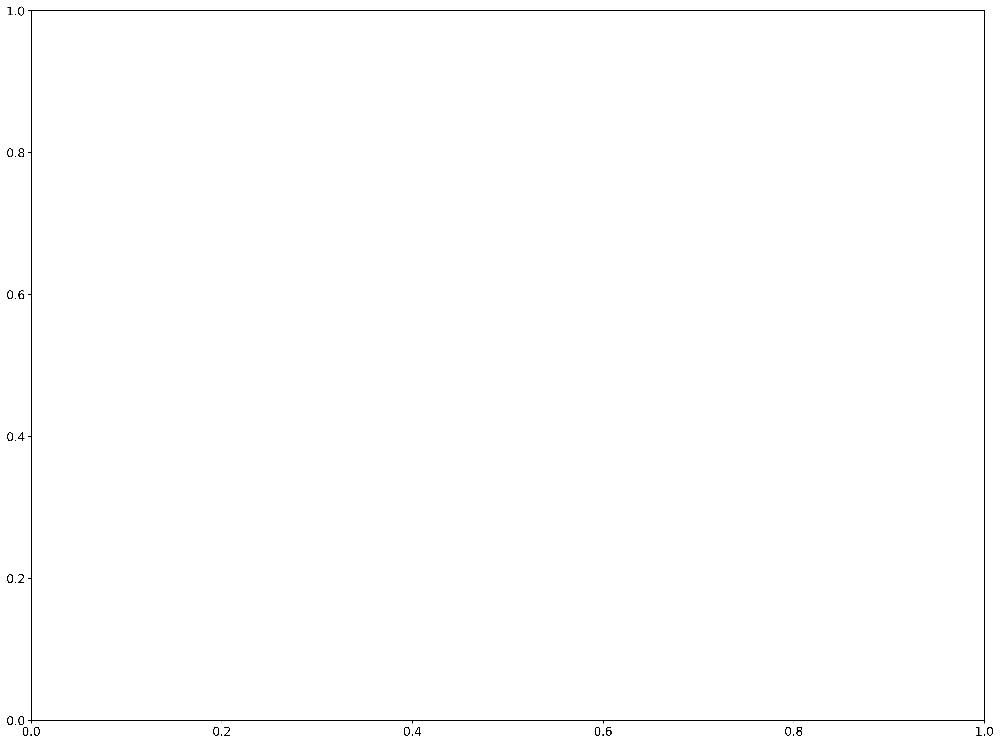

In [29]:
subset2 = [
            'cartesian_ddg_dir',
            'esm1v_mean_dir',
            'msa_transformer_mean_dir',
            'tranception_dir',
            'ankh_dir',
            'esm2_dir',
            'esmif_multimer_dir',
            'mpnn_20_00_dir',
            'mif_dir',
            'mifst_dir',
            'korpm_dir',
            'mutcomputex_dir',
            'stability-oracle_dir'
        ]

measurement = 'ddG'
statistic = 'spearman'
upper = 'delta'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, dfm.fillna(0), db['ddG'], statistic, measurement, n_bootstraps=5, upper=upper, subset=subset2, title='Q3421')
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}'])
stat_df['standardized_pair'] = stat_df.apply(lambda x: '_'.join(sorted([x['model1'] + str(x['weight1']), x['model2'] + str(x['weight2'])])), axis=1)
stat_df = stat_df.drop_duplicates(subset='standardized_pair')
stat_df = stat_df.drop(columns='standardized_pair').reset_index(drop=True).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1
stat_df = stat_df.set_index('rank')
stat_df

### Extra Figure (not in text) showing Net Stabilization instead

3421


  0%|          | 0/5 [00:00<?, ?it/s]

144.19
['Rosetta CartDDG', 'Tranception', 'ESM-IF', 'MIF-ST', 'ProteinMPNN 0.2', 'Ankh', 'ESM-2 3B', 'MSA-T mean', 'MIF', 'MutComputeX', 'Stability Oracle', 'ESM-1V mean', 'KORPM']


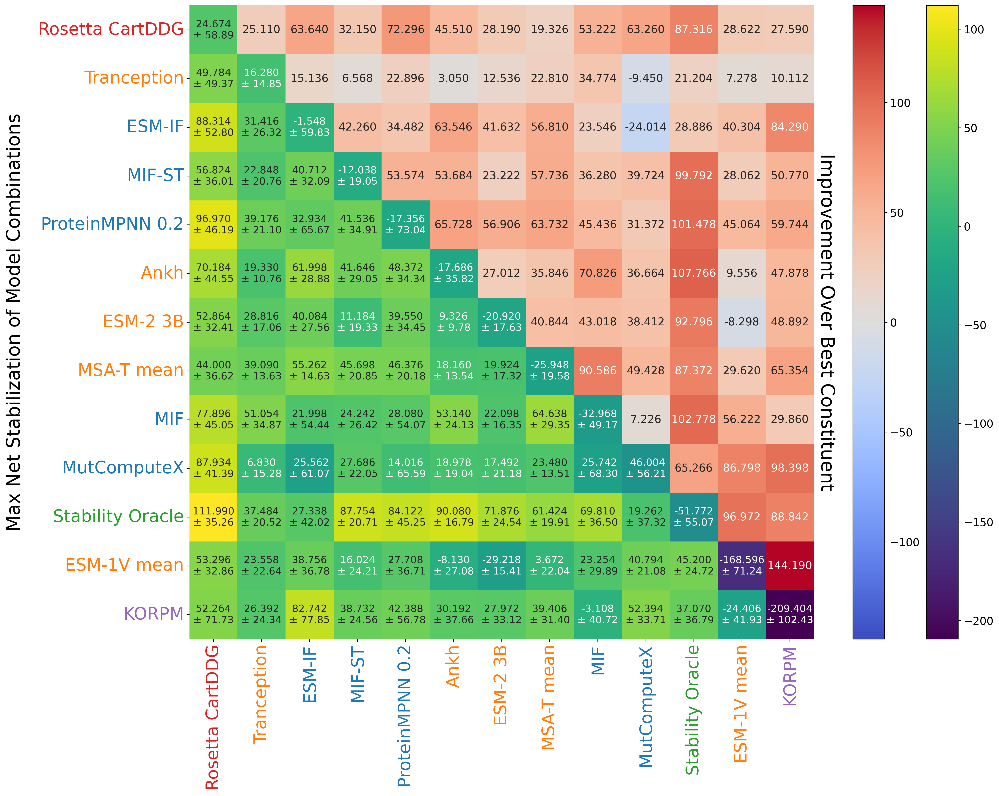

,model1,weight1,model2,weight2,mean_net_stabilization,p_value
rank,,,,,,
1,cartesian_ddg_dir,1,stability-oracle_dir,0.5,111.99,0.0028
2,stability-oracle_dir,1,cartesian_ddg_dir,1,102.278,0.017209
3,cartesian_ddg_dir,1,mpnn_20_00_dir,0.5,96.97,0.031746
4,cartesian_ddg_dir,1,mpnn_20_00_dir,0.2,91.388,0.028566
5,stability-oracle_dir,1,ankh_dir,0.2,90.08,0.001386
...,...,...,...,...,...,...
386,korpm_dir,1,stability-oracle_dir,0.2,-78.856,0.566594
387,korpm_dir,1,tranception_dir,0.2,-87.286,0.041322
388,korpm_dir,1,esm2_dir,0.2,-89.992,0.014074


In [ ]:
measurement = 'ddG'
statistic = 'net_stabilization'
upper = 'delta'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, dfm.fillna(0), db_ddg, statistic, measurement, n_bootstraps=5, upper=upper, subset=subset2)
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}'])
stat_df['standardized_pair'] = stat_df.apply(lambda x: '_'.join(sorted([x['model1'] + str(x['weight1']), x['model2'] + str(x['weight2'])])), axis=1)
stat_df = stat_df.drop_duplicates(subset='standardized_pair')
stat_df = stat_df.drop(columns='standardized_pair').reset_index(drop=True).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1
stat_df = stat_df.set_index('rank')
#stat_df.loc[stat_df['runtime_gpu']<0, 'runtime_gpu'] = np.nan
stat_df

# ~ 10 seconds

### Supplementary Figure 8

0.0012587865379530998


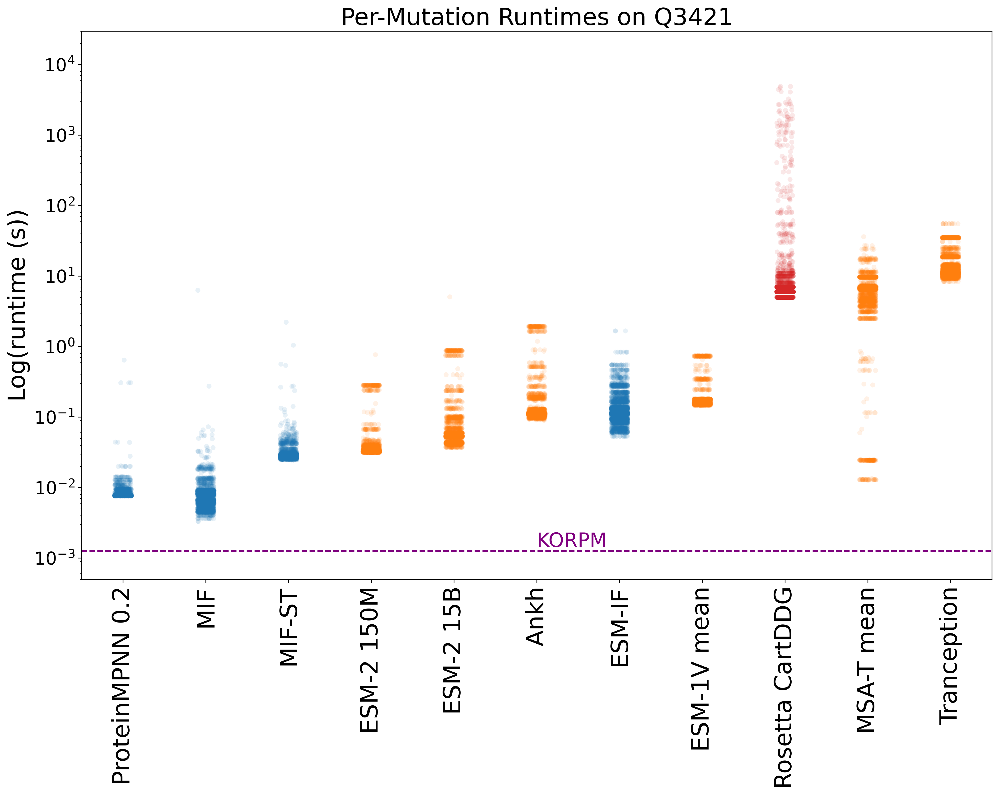

In [ ]:
int_runtimes = db_runtimes.dropna(axis=1, how='all')#.groupby('code').mean()#.sum() #uncomment to get mean per protein
int_runtimes = int_runtimes[[
                             'runtime_esmif_multimer_dir',
                             'runtime_mif_dir',
                             'runtime_mifst_dir',
                             'runtime_mpnn_20_00_dir',
                             'runtime_tranception_dir',
                             'runtime_msa_transformer_mean_dir',
                             'runtime_esm1v_mean_dir',
                             'runtime_esm2_150M_dir',
                             'runtime_cartesian_ddg_dir',
                             'runtime_ankh_dir',
                             'runtime_esm2_15B_half_dir',
                             'runtime_korpm_dir'
                            ]]

int_runtimes.columns = [c[8:-4] for c in int_runtimes.columns]
#int_runtimes.columns = int_runtimes.columns.map(analysis_utils.remap_names)
total_runtimes = int_runtimes.melt().sort_values('value')#.sum(axis=0)

### determine order for displaying runtimes
# Calculate the grouped median
grouped_median = total_runtimes.groupby('variable')['value'].median()
# Create a temporary column 'group_median' with the grouped medians mapped to each row
total_runtimes['group_median'] = total_runtimes['variable'].map(grouped_median)
# Sort the DataFrame first by 'group_median' and then by 'variable'
df_sorted = total_runtimes.sort_values(['group_median', 'variable'], ascending=True)
# Drop the temporary column 'group_median'
total_runtimes = df_sorted.drop(columns=['group_median'])
korpm_time = total_runtimes.loc[total_runtimes['variable']=='korpm', 'value'].mean()
print(korpm_time)
total_runtimes = total_runtimes.loc[total_runtimes['variable']!='korpm']

total_runtimes['category'] = total_runtimes['variable'].apply(lambda x: analysis_utils.determine_category(x))
total_runtimes['color'] = total_runtimes['variable'].apply(lambda x: analysis_utils.determine_base_color(x))

custom_palette = [
    (0.12156863, 0.46666667, 0.70588235),  # blue
    (1.0, 0.49803922, 0.05490196),  # orange
    (0.8392156862745098, 0.153, 0.153)  # red
]

# Set the custom palette
sns.set_palette(custom_palette)

fig, ax = plt.subplots(figsize=(1.5*total_runtimes['variable'].nunique(), 10), dpi=300)  # adjust the size here
ax = sns.stripplot(data=total_runtimes, x='variable', y='value', hue='color', alpha=0.1, legend=False)

plt.axhline(y=korpm_time, color='purple', linestyle='--', label='KORPM')
plt.text(5, korpm_time, 'KORPM', color='purple', verticalalignment='bottom')

remapped_x = [remap_names[tick.get_text()] if tick.get_text() in remap_names.keys() else tick.get_text() for tick in ax.get_xticklabels()]
ax.set_xticklabels(remapped_x)
ax.set_yticklabels(remapped_x[::-1])
plt.title('Per-Mutation Runtimes on Q3421')
plt.yscale('log')
plt.ylim(0.0005, 30000)
plt.xticks(rotation=90, fontsize=24)
plt.xlabel('')
plt.yticks(fontsize=18)
plt.ylabel('Log(runtime (s))', fontsize=24)
plt.show()

### Following cells relate to preprocessing required for Supplementary Figure 2

### Supplementary Figure 2

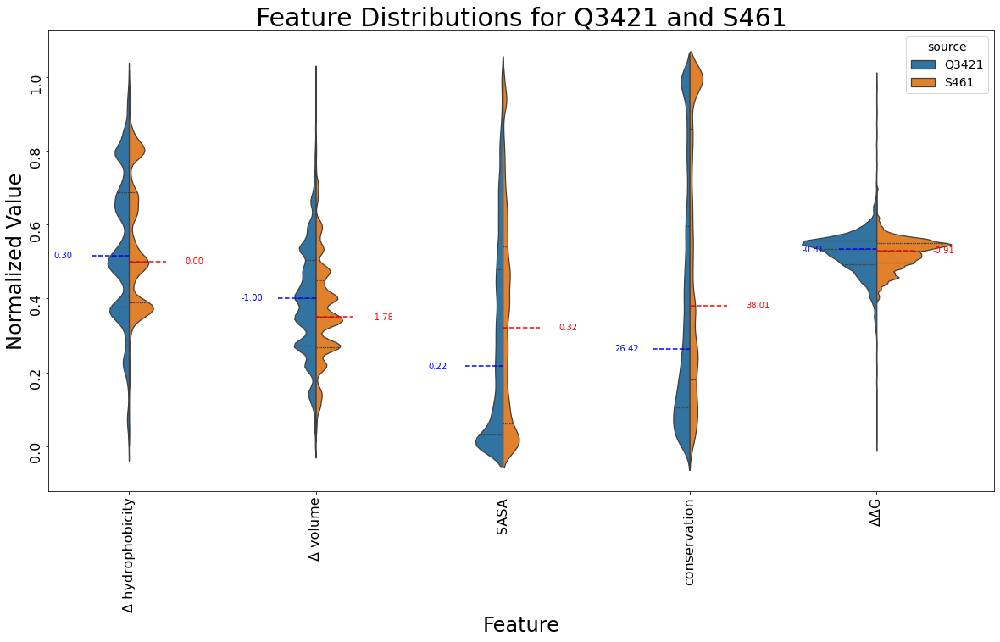

In [ ]:
s461_feats = pd.read_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv'))
#compare_distributions_violin(db_feats_2.drop(['n_seqs', 'on_interface', 'column_completeness', 'saltbrs'], axis=1).join(db_ddg), s461_feats, shared_columns=['delta_kdh', 'delta_vol', 'rel_ASA', 'conservation', 'ddG'])
analysis_utils.compare_distributions_violin(db, s461_feats, shared_columns=['delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'conservation', 'ddG'], source1='Q3421', label_adjust=0.2)

### Figure 5 (Methods)

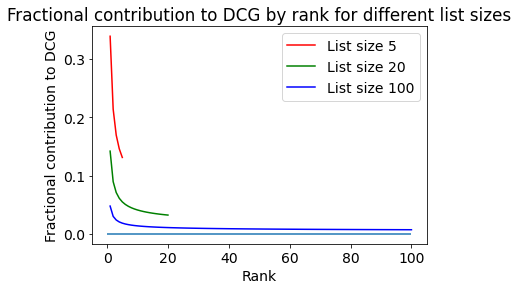

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def fractional_contributions(list_size, base=2):
    ranks = np.arange(1, list_size+1)
    discounts = 1 / np.log2(ranks + 1)  # compute the discount for each rank
    return discounts / np.sum(discounts)  # normalize to get fractional contributions

list_sizes = [5, 20, 100]
colors = ['r', 'g', 'b']

for i, list_size in enumerate(list_sizes):
    fractions = fractional_contributions(list_size)
    plt.plot(np.arange(1, list_size+1), fractions, color=colors[i], label=f'List size {list_size}')

plt.xlabel('Rank')
plt.ylabel('Fractional contribution to DCG')
plt.title('Fractional contribution to DCG by rank for different list sizes')
plt.hlines(0, 0, 100)
plt.legend()
plt.show()